# CH6. Time Series Analysis and Forecasting

Motivation: Time series data가 금융/경제 지표에 내제되어 있을 뿐더러 대다수의 시계열 데이터를 포함하고 있다.

□ 시계열 모델링이나 예측에 대한 방법론
- 통계적 방법(Ch6)
- 머신러닝 접근법(Ch7)
- 딥러닝 사용(Ch15)

□ "전통적인 통계적 방법이 여전히 최고의 성능을 보여주고 있다."
- 매우 적은 훈련 데이터에 대해(예. 3년간 월별 데이터) → ML모델은 패턴 학습이 어렵다.
- 최근 M-Competition(@Spyros Makridakis 시계열 예측 대회)에서 통계적 방식이 몇 번의 우승

□ 이번 chapter 주요 내용: 
- 시계열 building block, Decomposition method(분해), Stationarity(정상성) 개념
- 두 가지 통계적 접근 방식: 지수 평활법(Exponential Smoothing), ARIMA 모델

□ 순서:
1. 시계열 분해(Time series decomposition)
2. 시계열 정상성(stationarity) 테스트
3. 시계열의 정상성 correction
4. 지수 평활법(Exponential smoothing methods)을 사용한 시계열 모델링
5. ARIMA 클래스 모델을 사용한 시계열 모델링
6. auto-ARIMA를 사용한 best fitting ARIMA 모델 찾기

## 6.1 Time series decomposition

□ Time series decomposition의 목표
- 시계열을 여러 구성 요소로 나누어 **데이터에 대한 이해도**를 높임.
- 모델링 복잡성에 대한 insight 제공 및 **적합한 접근 방식** 제시.

□ 예시: 추세(trend) 분해
- 추세 분리 및 제거: 증가 또는 감소하는 추세가 뚜렷한 시계열에서, 추세를 분리해 제거함으로써 시계열을 **정상성(stationarity)** 상태로 만듦.
- **추세 추가**: 나머지 구성 요소를 처리한 후, 추세를 다시 추가하여 **예측 정확도** 향상.
- **추세 모델링**: 충분한 데이터와 적절한 특성을 제공하여 **알고리즘이 추세를 모델링**할 수 있음.

※ 시계열 데이터에서 정상성
- 평균, 분산, 공분산이 시간에 따라 일정한 상태
- 정상적인 시계열은 시간이 지남에 따라 이러한 통계적 특성이 변하지 않는다는 것을 의미

※ 비정상적(non-stationary) 상태에서는 모델링이 어렵거나 예측의 정확도가 떨어질 수 있음


▶ 정리: trend를 제거하는 이유
 - 정상성 확보: 시계열 모델링의 전제 조건인 정상성을 충족하기 위해(시간이 지남에 따라 평균이 변화하므로 정상적이지 않은 경우가 많음)
 - 더 나은 예측: 추세를 분리하여 나머지 데이터의 패턴을 정확하게 포착한 후, 추세를 다시 추가함으로써 더 정교한 예측이 가능


□ 시계열의 구성 요소
1. **체계적 요소 (Systematic)**: 일관성이 있고 설명 및 모델링 가능한 특징을 가짐
- 수준(Level): 시계열의 평균값
- 추세(Trend): 특정 시점에서 연속적인 시간 점들 사이의 값 변화에 대한 추정치. 시계열의 기울기(증가/감소)와 관련될 수 있음. 즉, **장기**간에 걸친 시계열의 일반적인 방향
- 계절성(Seasonality): 일정하고 알려진 주기를 가진 반복적인 **단기** 사이클로 인해 평균에서 벗어나는 변동.
   
2. **비체계적 요소 (Non-systematic)**: 직접적으로 **모델링 불가**, 설명되지 않는 특징
- 노이즈(Noise): 시계열에서 임의의 변동. 이는 다른 구성 요소들을 제거한 후에 관찰되는 모든 변동을 포함


□ 시계열 분해 방식

1. Additive Model 특징
- **모델의 형태**: 𝑦(𝑡) = 수준(Level) + 추세(Trend) + 계절성(Seasonality) + 노이즈(Noise)
- **선형 모델**: 시간이 지남에 따라 변화의 크기가 일정함
- **trend가 선형적**: 직선 형태의 추세
- **선형적 seasonality**: 시간이 지나도 주기(폭)와 진폭(높이)이 일정한 사이클을 가짐

2. Multiplicative Model 특징
- **모델의 형태**: 𝑦(𝑡) = 수준(Level) * 추세(Trend) * 계절성(Seasonality) * 노이즈(Noise)
- **비선형 모델**: 시간이 지남에 따라 변화의 크기가 일정하지 않음 (예: exponential 함수형)
- **곡선형 비선형 trend**: 추세가 곡선 형태로 나타남
- **비선형적 계절성**: 시간이 지남에 따라 주기(폭)와 진폭(높이)이 증가하거나 감소하는 사이클을 가짐

□ Additive와 Multiplicative 특성이 결합된 시계열 모델 예시

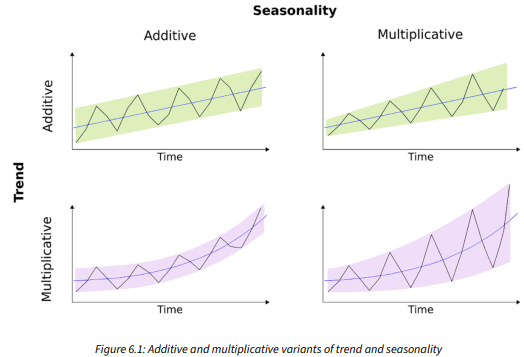

※ 승법 모델로 작업이 어려운 경우: 로그 변환(logarithmic transformation)을 통해 승법 모델을 가법 모델로 변환

&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;&nbsp;

□ 실습: Nasdaq Data Link에서 다운로드한 월간 미국 실업률 데이터를 사용하여 시계열 분해를 수행하는 방법을 소개

In [7]:
# !pip install nasdaq-data-link

In [55]:
%matplotlib inline
%config InlineBackend.figure_format = "retina"

import matplotlib.pyplot as plt
import seaborn as sns

import warnings
import pandas as pd

# SettingWithCopyWarning 경고를 무시하는 코드
warnings.simplefilter(action='ignore', category=pd.errors.SettingWithCopyWarning)
# warnings.simplefilter(action="ignore", category=FutureWarning)
# warnings.simplefilter(action="ignore", category=SettingWithCopyWarning)

# feel free to modify, for example, change the context to "notebook"
sns.set_theme(context="talk", style="whitegrid", 
              palette="colorblind", color_codes=True, 
              rc={"figure.figsize": [12, 8]})

1. Import the libraries and authenticate:

In [345]:
import pandas as pd
import nasdaqdatalink
import seaborn as sns
from statsmodels.tsa.seasonal import seasonal_decompose
nasdaqdatalink.ApiConfig.api_key = "K6ZEYjAnV7gDVuDhz3**"

2. Download the monthly US unemployment rate from the years 2010 to 2019:

*the COVID-19 pandemic caused quite abrupt changes in 
any patterns observable in the unemployment rate time series

In [5]:
df = (
 nasdaqdatalink.get(dataset="FRED/UNRATENSA",
 start_date="2010-01-01",
 end_date="2019-12-31")
 .rename(columns={"Value": "unemp_rate"})
)

In [6]:
df.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


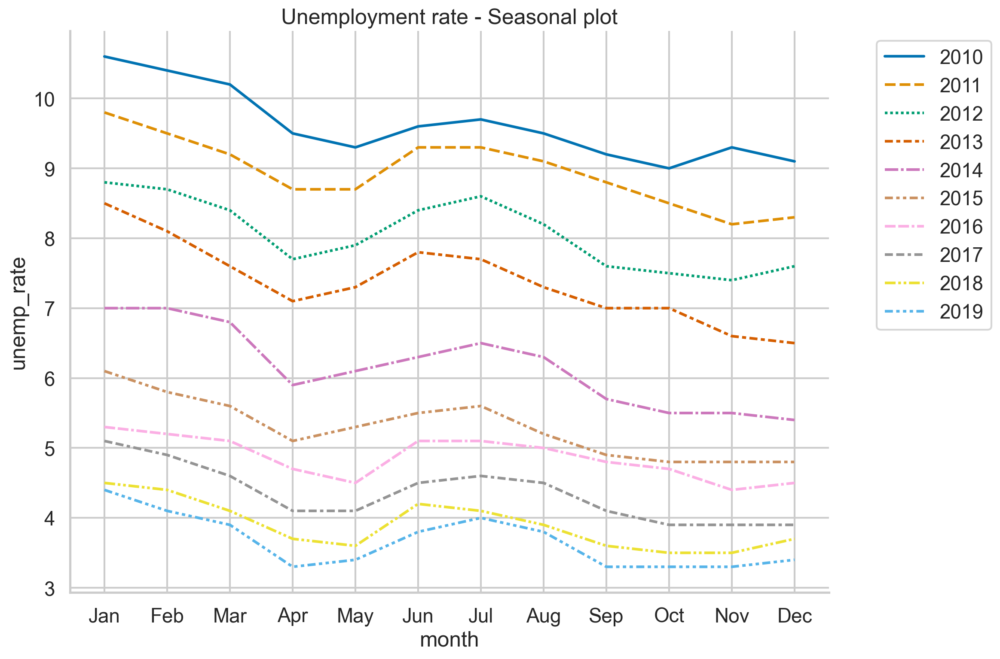

In [11]:
# a quick look at the plot
temp_df = df.copy()

temp_df["year"] = temp_df.index.year
temp_df["month"] = temp_df.index.strftime("%b")

sns.lineplot(data=temp_df, 
             x="month", 
             y="unemp_rate", 
             hue="year",
             style="year", 
             legend="full",
             palette="colorblind")

plt.title("Unemployment rate - Seasonal plot")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2);

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_2", dpi=200)

*recent 데이터는?

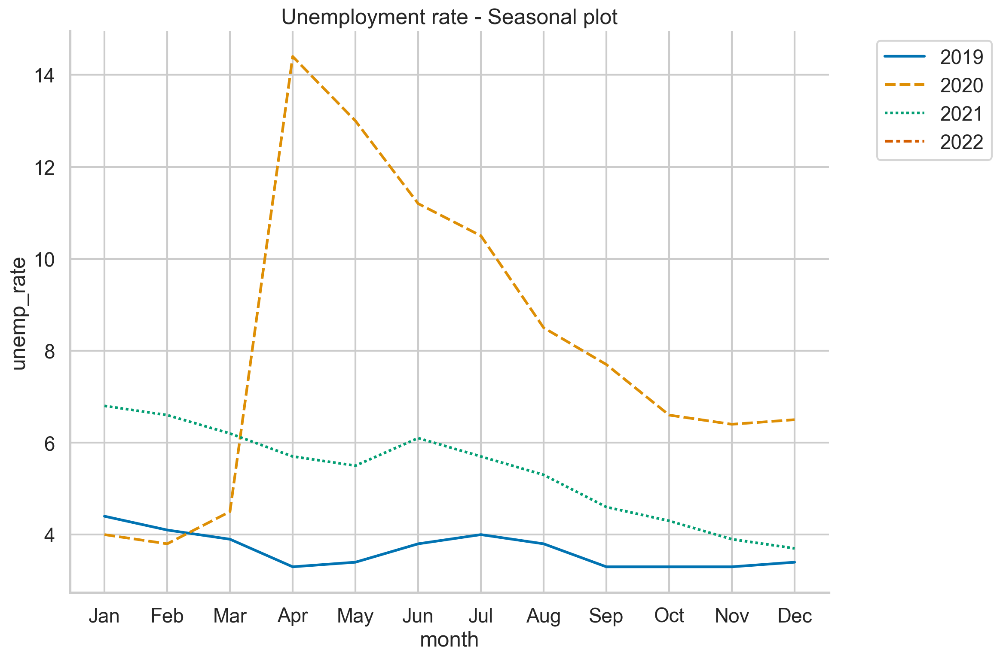

In [20]:
df_recent = (
 nasdaqdatalink.get(dataset="FRED/UNRATENSA",
 start_date="2019-01-01",
 end_date="2023-12-31")
 .rename(columns={"Value": "unemp_rate"})
)

# a quick look at the plot
temp_df_recent = df_recent.copy()

temp_df_recent["year"] = temp_df_recent.index.year
temp_df_recent["month"] = temp_df_recent.index.strftime("%b")

sns.lineplot(data=temp_df_recent, 
             x="month", 
             y="unemp_rate", 
             hue="year",
             style="year", 
             legend="full",
             palette="colorblind")

plt.title("Unemployment rate - Seasonal plot")
plt.legend(bbox_to_anchor=(1.05, 1), loc=2);

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_2", dpi=200)

In [21]:
print(df_recent[df_resent.index.year >= 2022])

            unemp_rate
Date                  
2022-01-01         4.4


*FRED/UNRATENSA 데이터셋에는 2022년 1월 1일 이후 데이터가 없다... 이유는?

3. Add rolling mean and standard deviation

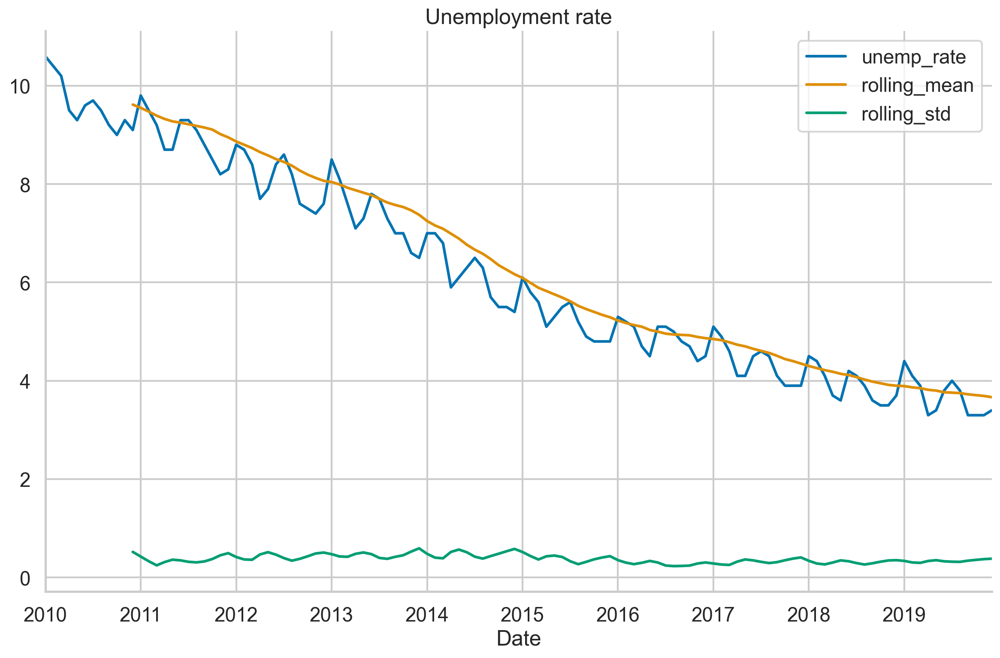

In [23]:
WINDOW_SIZE = 12
df["rolling_mean"] = df["unemp_rate"].rolling(window=WINDOW_SIZE).mean()
df["rolling_std"] = df["unemp_rate"].rolling(window=WINDOW_SIZE).std()
df.plot(title="Unemployment rate")

sns.despine()
plt.tight_layout()

→ 분석: 12개월 window size로</br>
- 이동 평균선: 이동 평균은 시간에 따른 데이터의 변동성을 줄여, 추세를 더 쉽게 파악</br>
- 이동 표준편차: 각 기간의 데이터 변동성을 보여주며, 실업률 변동의 크기를 파악하는 데 유용

그래프를 통해 trend와 seasonality가 선형 패턴을 나타내는 것으로 추론</br>
(seasonality는 진동폭이나 주기가 일정하므로...)</br>
이에따라, additive decomposition 적용

4.  Carry out the seasonal decomposition using the additive model:

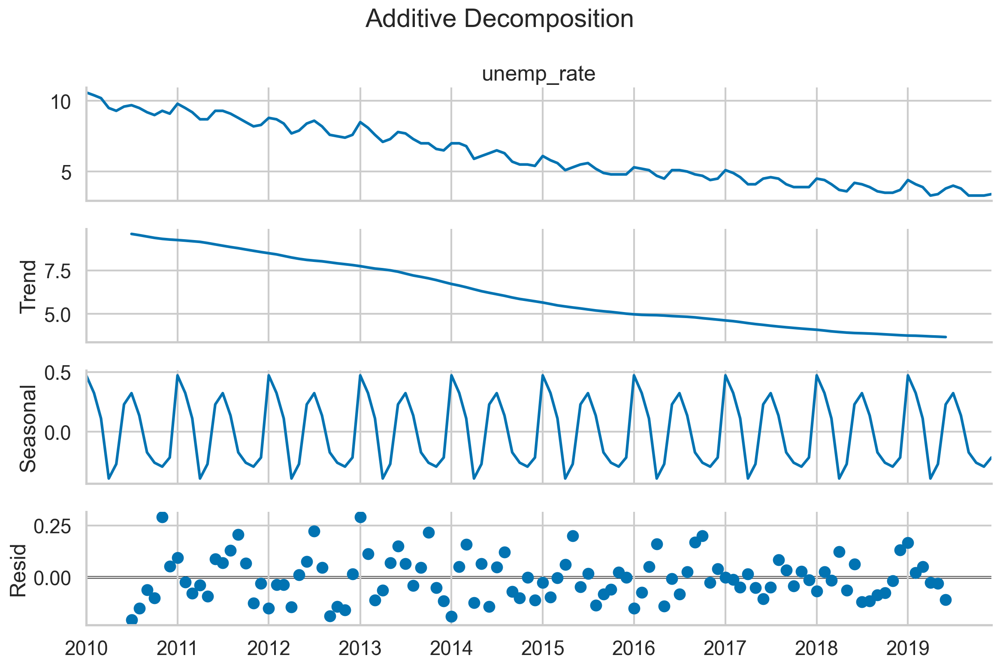

In [28]:
decomposition_results = seasonal_decompose(df["unemp_rate"], model="additive")
(
    decomposition_results
    .plot()
    .suptitle("Additive Decomposition")
) # 메서드 체이닝(method chaining) 형식
# decomposition_results.plot().suptitle("Additive Decomposition")

sns.despine()
plt.tight_layout()

- 추세 (Trend): 데이터의 장기적인 증가 또는 감소 경향
- 계절성 (Seasonality): 반복적으로 나타나는 패턴
- 잔차 (Residual): 추세와 계절성을 제거한 후 남은 불규칙한 변동(노이즈)

※ decomposition이 적절히 이루어졌는지 확인 방법...</br>
&nbsp;&nbsp;&nbsp;&nbsp;잔차에서 뚜렷한 패턴이 없고, 시간이 지나도 일관된 변동을 보인다면, 분해가 적절하게 이루어진 것

→ 그래프 해석:</br>
. In this case, it looks like the variance in the 
residuals is slightly higher in the first half of the dataset. This can indicate that a constant seasonal 
pattern is not good enough to accurately capture the seasonal component of the analyzed time series.

※ seasonal_decompose 함수를 숫자의 배열에 사용할 때는 관측값의 주기(freq)를 명시해야 함.</br>
&nbsp;&nbsp;&nbsp;&nbsp;다만, pandas Series 객체를 사용할 경우 주기를 지정할 필요가 없음.</br>
&nbsp;&nbsp;&nbsp;&nbsp;(pandas가 시계열 데이터를 처리할 때, 데이터의 인덱스에서 주기 정보를 자동으로 추론할 수 있기 때문, pandas가 알아서 주기성을 파악하여 처리)

 ※ "If we have missing values or want to extrapolate the residuals for the missing 
periods at the beginning and the end of the time series, we can pass an extra argument 
extrapolate_trend='freq'"

추가 설명:</br>
시계열 데이터에 결측값(missing values)이 있거나, 시계열의 처음이나 끝부분에 충분한 데이터가 없을 경우(예: 처음 몇 개의 데이터 포인트가 없을 때), 함수는 정확한 추세나 잔차를 계산하기 어려울 수 있음</br>
extrapolate_trend='freq' 인수를 추가하면 주기(frequency)를 바탕으로 잔차나 추세를 외삽(extrapolate)하여, 처음이나 끝부분에 결측된 값을 예측할 수 있음

In [346]:
import numpy as np

In [349]:
# # pandas Series 데이터 생성 (일부 결측치 포함)
# data_with_missing = pd.Series([np.nan, 130, 140, 150, 160, 170, 180, 190, 200, 210, 220, np.nan])
# # 계절 분해 (extrapolate_trend='freq' 사용)
# result = seasonal_decompose(data_with_missing, model='additive', period=12, extrapolate_trend='freq')

# result.plot()

In [350]:
# 예시 데이터: 2010년부터 2020년까지의 월별 실업률 데이터 (일부 결측값 포함)
data = pd.Series([None, 8.2, 8.1, 8.0, 7.9, 7.8, 7.6, 7.5, 7.4, 7.3, 7.2, 7.1, None],
                 index=pd.date_range(start='2010-01-01', periods=13, freq='M'))

# 결측값을 처리하고 외삽
result = seasonal_decompose(data, model='additive', extrapolate_trend='freq')

C:\Users\naare\AppData\Local\Temp\ipykernel_11764\2299224366.py:3: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  index=pd.date_range(start='2010-01-01', periods=13, freq='M'))


ValueError: This function does not handle missing values

→ 동작을 안한다.

### How it works...
이미 설명됨...

### There's more

□ Seasonal decomposition의 단점

- 중앙 이동 평균(centered moving averages)을 사용하여 추세를 추정하므로, 시계열의 처음과 끝에서 추세와 잔차 값이 누락
- seasonal 패턴이 매년 반복된다고 가정하는데, 이는 특히 장기 시계열에서 지나치게 강한 가정임
- 추세선이 데이터를 과도하게 smoothing하여 급격한 변동이나 돌발 상황에 적절히 반응하지 못하는 경향이 있음
- 이 방법은 데이터에 잠재적으로 존재하는 이상치(outliers)에 취약

□ 이러한 한계를 보완하기 위해, 시계열 분해의 대안적인 방법들
- LOESS(국부 회귀, LOcally Estimated Scatterplot Smoothing)를 사용한 계절 및 추세 분해인 STL decomposition: 비선형 관계를 추정하는 방법

### STL Decomposition(Seasonal-Trend decomposition using Loess)

□ STL의 장점
- STL은 어떤 종류의 계절성도 처리(다른 방법들은 월별 또는 분기별로 제한되는 경우가 있음)
- 사용자에게 추세의 smoothness을 제어할 수 있는 기능을 제공
- 계절성 요소는 시간이 지남에 따라 변할 수 있으며, 그 변화 속도도 사용자가 조절할 수 있음
- 이상치에 더 강건. 추세와 계절성 요소의 추정이 이상치에 영향을 받지 않으며, 그 영향은 잔여 요소에만 나타남

□ 단점</br>
&nbsp;&nbsp;&nbsp;&nbsp;: STL은 additive decomposition에서만 사용할 수 있으며, 영업일/달력 변동을 자동으로 고려하지 않음
- 데이터의 구성 요소들이 더해져서 최종 시계열을 형성한다고 가정(요소의 변동이 서로 독립적으로 더해진다고 생각)</br>
cf. 승법에서는 요소들이 서로 의존적이라고 가정(예. 매출이 증가할 때 계절성의 영향도 더 커질 수 있음)
- 데이터가 일정한 주기로 반복된다는 전제를 바탕으로 작동(예. 매월의 데이터가 있다고 하면, 매달의 길이가 같다는 전제에서 계절성을 추정)</br>
  하지만 영업일이나 달력 변동(예: 한 달에 포함된 일수, 휴일, 영업일 차이 등)은 자동으로 고려되지 않음</br>
  2월처럼 짧은 달은 매출이 적고, 12월처럼 휴일이 많은 달은 매출이 증가할 수 있으나, 이러한 변동을 STL은 자동으로 고려하지 않기 때문에, 사용자가 직접 이런 요인을 반영하거나 모델링할 필요

※ 최근에는 STL 분해의 변형된 방식이 등장하여 다중 계절성(multiple seasonalities)을 처리</br>
&nbsp;&nbsp;&nbsp;&nbsp;예를 들어, 시간별 데이터에서는 일간/주간/월간의 계절성이 나타날 수 있음.</br>
&nbsp;&nbsp;&nbsp;&nbsp;이 접근법은 LOESS를 사용한 다중 계절-추세 분해(MSTL, Multiple Seasonal-Trend Decomposition using LOESS)라고 불림

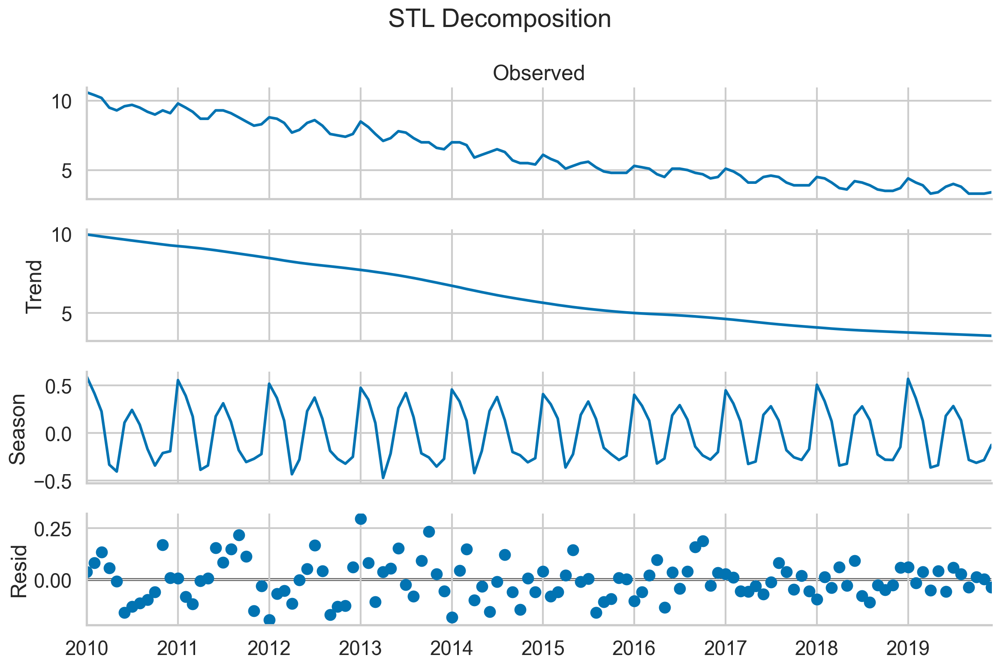

In [47]:
from statsmodels.tsa.seasonal import STL

stl_decomposition = STL(df[["unemp_rate"]]).fit()
stl_decomposition.plot().suptitle("STL Decomposition")

sns.despine()
plt.tight_layout()

Text(0.5, 0.98, 'STL Decomposition')

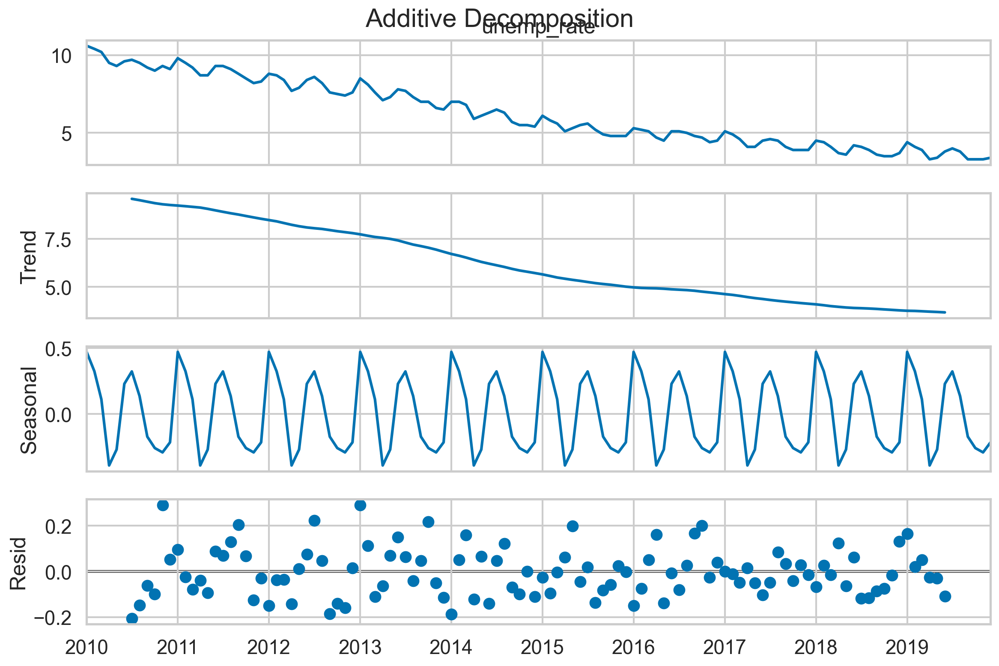

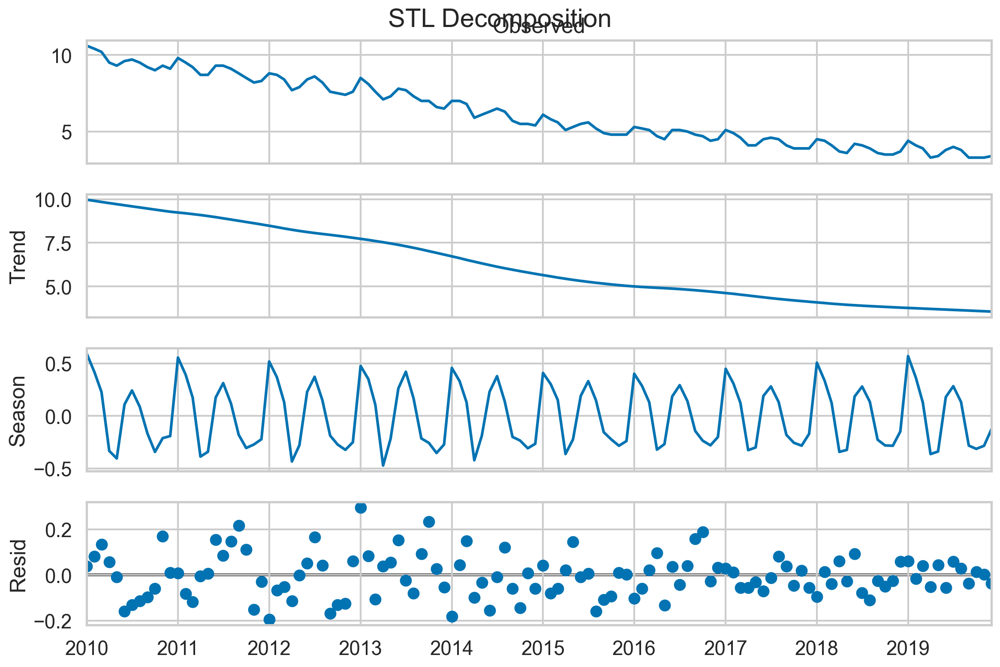

In [48]:
decomposition_results.plot().suptitle("Additive Decomposition")
stl_decomposition.plot().suptitle("STL Decomposition")

→ 분석: classical decomposition과 비교했을 때 STL decomposition의 이점과 관련된 몇 가지 미묘한 차이점
- 추세 추정치에 결측값이 없음
- 계절성 요소가 시간이 지남에 따라 천천히 변화(예. 1월)

※ STL참고 사항
- STL에서 seasonal 인수의 기본값은 7로 설정되어 있지만, 이 방법의 저자들은 더 큰 값(7 이상의 홀수)을 사용할 것을 권장</br>
seasonal=7은 짧은 주기(예: 일주일 주기)를 분석할 때 유용하지만, 저자들은 더 긴 주기를 분석할 때는 더 큰 홀수 값(7 이상)을 사용하는 것이 더 적합하다고 제안
- 계절성 요소를 추정할 때 사용되는 연속적인 연도의 수 값이 클수록 계절성 요소가 더 부드러워지며, 이는 시계열에서 관찰되는 변동 중 일부가 계절성보다는 다른 요소에 귀속되게 만듦</br>
작은 값: 계절성을 더 민감하게 감지하지만, 변동성이 커 보일 수</br>
큰 값: 더 부드러운 계절성 컴포넌트를 만들며, 작은 변동은 잔차로 처리</br>
- trend 인수도 비슷한 해석을 가지며, 이는 추세 요소를 추정하는 데 사용되는 연속적인 관측값의 수

&nbsp;&nbsp;&nbsp;&nbsp;코드 예시.</br>
&nbsp;&nbsp;&nbsp;&nbsp;stl = STL(data, seasonal=13)  # seasonal 인수를 13으로 설정


□ STL 분해의 장점 중 하나로 이상치에 대한 더 높은 robustness을 언급했는데...
- robust 인수를 사용하면 데이터에 의존하는 가중치 함수를 활성화
- LOESS(국소 회귀) 추정 시 관측값에 재가중치를 부여하여 LOWESS(Locally Weighted Scatterplot Smoothing)로 변환
- 강건한 추정을 사용할 경우, 모델은 잔차 구성 요소의 플롯에서 보이는 큰 오류(이상치)를 더 잘 견딜 수 있게 됨

C:\Users\naare\AppData\Local\Temp\ipykernel_11764\1938132748.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  index=pd.date_range('2020-01-01', periods=12, freq='M'))


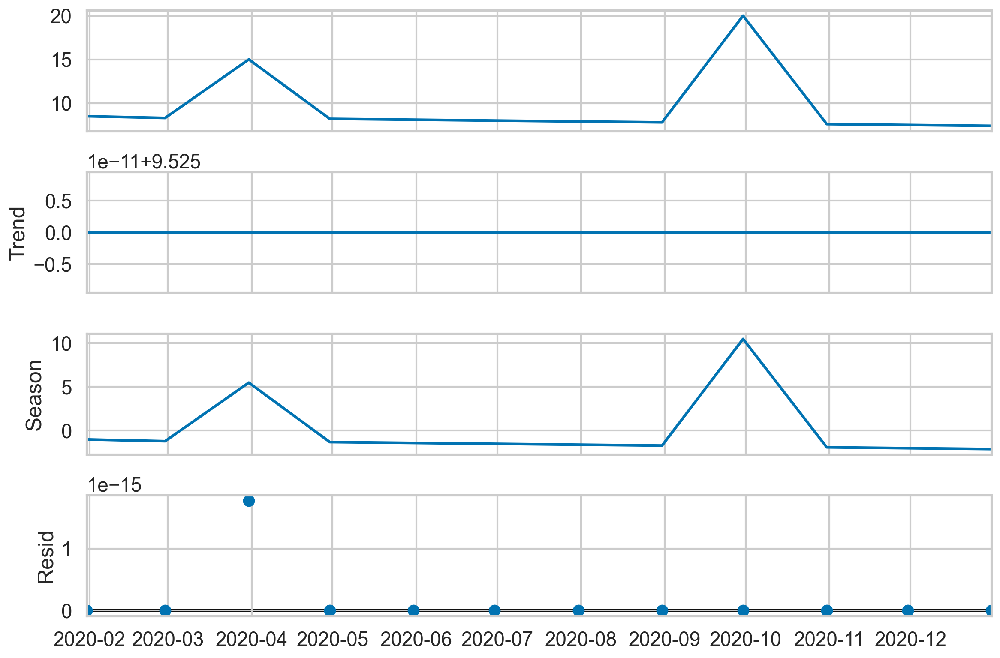

In [353]:
import pandas as pd
from statsmodels.tsa.seasonal import STL
import numpy as np
import matplotlib.pyplot as plt

# 예시 데이터 생성 (일부 이상치 포함)
data = pd.Series([8.5, 8.3, 15.0, 8.2, 8.1, 8.0, 7.9, 7.8, 20.0, 7.6, 7.5, 7.4],
                 index=pd.date_range('2020-01-01', periods=12, freq='M'))

# STL 분해 수행, 로버스트 옵션 활성화
stl = STL(data, seasonal=7, robust=True)
result = stl.fit()

# 결과 시각화
result.plot()
plt.show()

*Compare the decompositions with and without the robust setting:

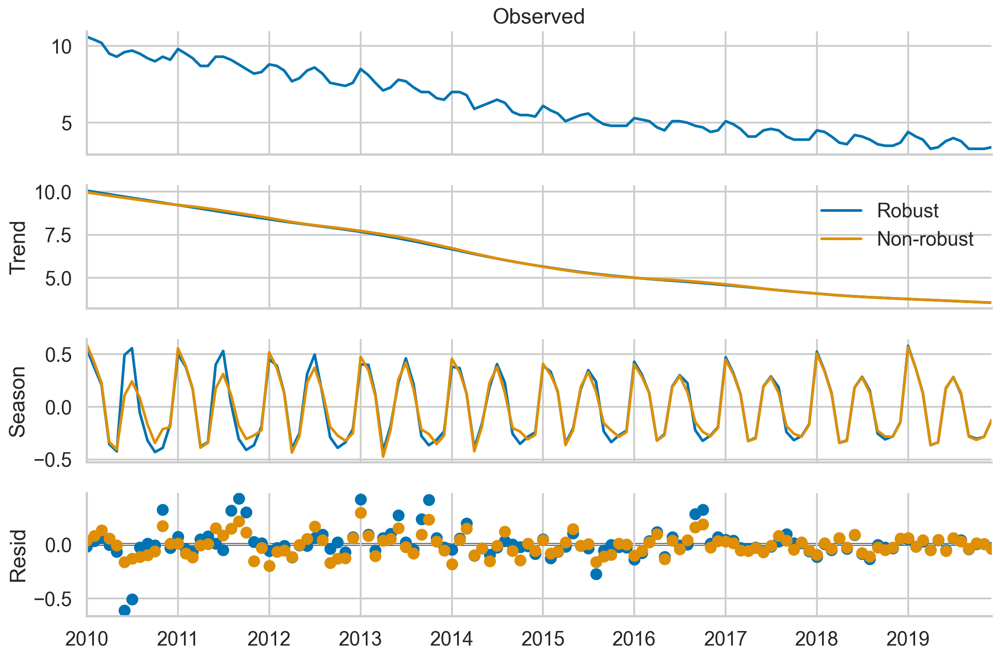

In [49]:
def add_second_stl_to_plot(fig, fitted_stl, labels):
    """
    A helper function adding the 3 components from the second STL fit to the 
    first STL plot
    """
    axs = fig.get_axes()
    comps = ["trend", "seasonal", "resid"]
    for ax, comp in zip(axs[1:], comps):
        series = getattr(fitted_stl, comp)
        if comp == "resid":
            ax.plot(series, marker="o", linestyle="none")
        else:
            ax.plot(series)
            if comp == "trend":
                ax.legend(labels, frameon=False)


stl_robust = STL(df[["unemp_rate"]], robust=True).fit()
stl_non_robust = STL(df[["unemp_rate"]], robust=False).fit()
fig = stl_robust.plot()
add_second_stl_to_plot(fig, stl_non_robust, ["Robust", "Non-robust"])

sns.despine()
plt.tight_layout()

robust=True로 설정하면, 계절성 컴포넌트가 이상치에 덜 민감하게 추정되며, 전체적인 시계열 데이터의 패턴이 더 부드럽고 안정적이게됨

- 강건한 추정을 사용한 효과: 더 큰 오류(이상치)가 허용되어 초기 몇 년 동안 계절성 요소의 형태가 다름</br>
- 어느 방식이 더 좋은지에 대한 명확한 답은 없으며, 이는 우리가 분해 결과를 어떻게 활용할지에 따라 달라짐</br>
- 계절성 분해 방법은 이상치 탐지 알고리즘으로도 사용할 수 있음</br>
 예를 들어, 시계열을 분해하고 잔차(residuals)를 추출한 다음, 잔차가 3배의 사분위 범위(IQR)를 벗어나는 관측값을 이상치로 표시</br>
 kats 라이브러리는 이러한 알고리즘을 OutlierDetector 클래스에서 구현

□ 다른 계절성 분해 방법
- ARIMA 시계열에서의 계절성 추출(SEATS) 분해: ARIMA 모델을 사용하여 시계열의 계절성을 추출하는 방법
- X11 분해: 이 방법은 모든 관측값에 대해 추세-주기(trend-cycle) 구성 요소를 생성하고, 계절성 요소가 시간이 지남에 따라 서서히 변할 수 있도록 허용
- Hodrick-Prescott 필터(HP 필터): 이 방법은 엄밀히 말해 계절성 분해 방법은 아니지만, 데이터를 평활화(smoothing)하는 기술로, 경기 순환에 관련된 단기 변동을 제거하는 데 사용</br>
 이를 통해 장기 추세를 드러낼 수 있음. HP 필터는 거시경제학에서 자주 사용되며, statsmodels의 hpfilter 함수에서 구현된 버전을 찾을 수 있음

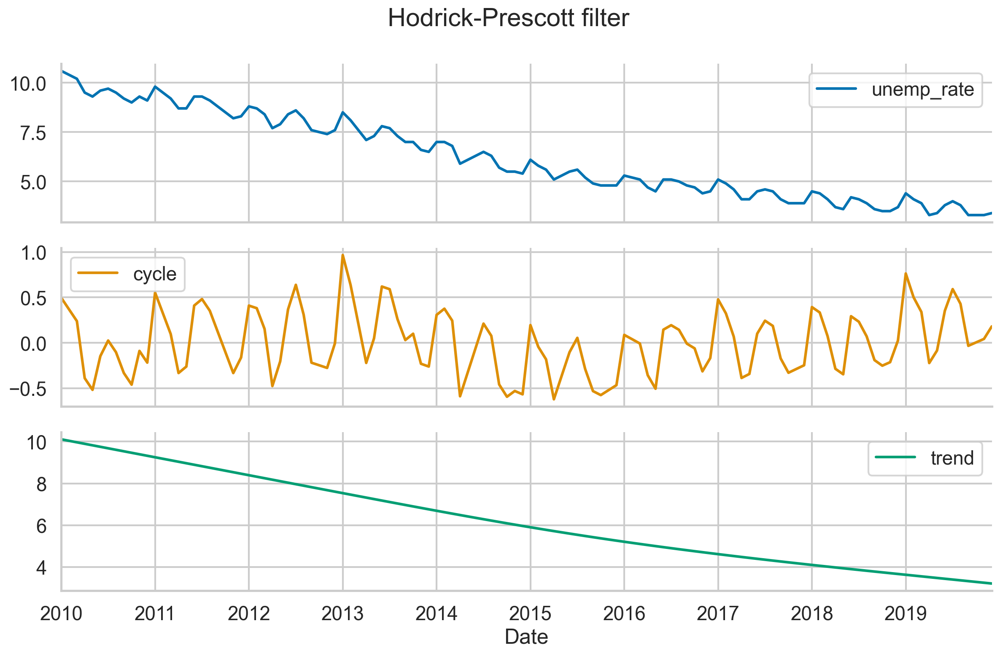

In [50]:
from statsmodels.tsa.filters.hp_filter import hpfilter

hp_df = df[["unemp_rate"]].copy()
hp_df["cycle"], hp_df["trend"] = hpfilter(hp_df["unemp_rate"], 129600)
hp_df.plot(subplots=True, title="Hodrick-Prescott filter")

sns.despine()
plt.tight_layout()

## 6.2 Testing for stationarity in time series

- stationary 시계열은 관측 시점에 관계없이 그 속성들이 변하지 않는 시계열을 의미</br>
- 다시 말해, stationarity은 특정 시계열의 Data Generating Process(DGP)의 통계적 속성이 시간이 지나도 변하지 않음</br>
- stationary 시계열에서는 추세(trend)나 계절적 패턴(seasonality)을 볼 수 없어야 함</br>
이러한 패턴이 존재한다면, 이는 stationary 가정을 위반</br>
cf. 백색 잡음(white noise) 과정은 언제 관측하든 항상 비슷한 모습이기 때문에 stationary


※ 추세(trend)와 계절성(seasonality)이 없지만 주기적(cyclic)인 패턴을 가진 시계열도 여전히 정상성(stationary)을 가질 수 있음</br>
&nbsp;&nbsp;&nbsp;&nbsp;이는 주기가 고정된 길이를 가지지 않기 때문</br>
&nbsp;&nbsp;&nbsp;&nbsp;따라서 시계열을 명확하게 관측하지 않는 한, 주기의 고점(peak)과 저점(trough)이 어디에 위치할지 확실히 알 수 없음

&nbsp;&nbsp;&nbsp;&nbsp;주기적 행동(cyclic behavior)은 계절성과는 달리 고정된 주기를 따르지 않음

&nbsp;&nbsp;&nbsp;&nbsp;예시. 경제 순환 주기 (Business Cycles):</br>
&nbsp;&nbsp;&nbsp;&nbsp;경제는 경기 확장과 수축을 주기적으로 반복하지만, 그 주기가 일정하지 않습니다.</br>
&nbsp;&nbsp;&nbsp;&nbsp;예를 들어, 3년 동안 경기 확장이 일어났다가, 2년간 경기 침체가 일어날 수 있습니다.</br>
&nbsp;&nbsp;&nbsp;&nbsp;이후 다시 4년 동안 확장되는 패턴을 보일 수 있습니다.</br>
&nbsp;&nbsp;&nbsp;&nbsp;이러한 불규칙한 주기를 가진 경제 데이터는 주기적 변동을 보이지만, 정상성을 유지할 수 있습니다.

→ 다시 말해, 주기적 행동을 보이지만 고정된 주기를 따르지 않기 때문에 정상성을 유지하는 시계열 데이터. 추세나 고정된 계절성이 없고, 주기적 패턴이 불규칙하게 변화할 경우, 시계열은 정상성을 가질 수 있다!!!

□ 정상성(stationarity)에는 여러 가지 정의가 있으며, 일부는 더 엄격한 가정을 요구</br>
&nbsp;&nbsp;&nbsp;&nbsp;실무에서는 주로 weak stationary 사용

□ 약한 정상성(weak stationarity) 또는 공분산 정상성(covariance stationarity) 조건
- 시계열의 평균(mean)이 일정
- 시계열의 분산(variance)이 유한하고 일정
- 동일한 시간 간격의 기간 사이의 공분산(covariance)이 일정

□ 정상성(stationarity)은 시계열에서 매우 바람직한 특성</br>
- 모델링과 extrapolating(forecasting)이 더 용이</br>
(정상적인 시계열은 통계적 성질이 시간이 지나도 변하지 않으므로, 예측이 더 쉬워짐)
- 정상성을 가진 시계열의 미래 통계적 특성이 과거와 동일하게 유지되기 때문에, 비정상적인 시계열보다 예측이 더 수월

□ 비정상적인(non-stationary) 데이터의 몇 가지 단점</br>
- 분산(variance)이 모델에 의해 잘못 지정될 수 있음: 데이터의 분산이 시간에 따라 변하면 모델이 이를 올바르게 처리하지 못할 수 있음
- 모델 적합도(model fit)가 나빠지며, 그 결과 예측 성능이 저하: 비정상성 데이터는 일관된 패턴이 없기 때문에 예측 모델이 정확하게 적합되지 않을 수 있음
- 데이터에서 시간 의존적인 유용한 패턴을 활용할 수 없음: 정상성 데이터와 달리, 비정상성 데이터는 시간에 따른 패턴을 찾기 어렵기 때문에 이러한 패턴을 모델링하는 데 어려움

※ 정상성(stationarity)이 시계열에서 바람직한 특성일 수 있지만, 이것이 모든 통계 모델에 적용되는 것은 아님.</br>

&nbsp;&nbsp;&nbsp;&nbsp;stationarity 유리한 모델: auto-regressive model(AR, ARMA, ARIMA 등)을 사용하여 시계열을 모델링할 때는 정상성을 유지하는 것이 중요. </br>
&nbsp;&nbsp;&nbsp;&nbsp;stationarity 유리하지 않은 모델: 시계열 decomposition에 크게 의존하는 모델(exponential smoothing methods 또는 Facebook의 Prophet 등)은 정상성 데이터로부터 특별한 이점을 얻지 못할 수 있음

□ 시계열 stationarity를 테스트하는 방법
- Augmented Dickey-Fuller(ADF) test</br>

- Kwiatkowski-Phillips-Schmidt-Shin(KPSS) 테스트</br>
- (partial)autocorrelation function(PACF/ACF) 플롯</br>
ACF: 여러 시차에서 데이터 간의 전체 상관관계를 측정하는 함수</br>
PACF: 특정 시차(lag)의 상관관계만을 고려한 상관관계 측정

□ 실습

monthly US unemployment rates 시계열 데이터의 이동 평균과 표준편차를 보여주는 플롯(Figure 6.3)에서 이미 시간이 지남에 따라 negative trend가 나타났으며, 이는 비정상성(non-stationarity)을 시사

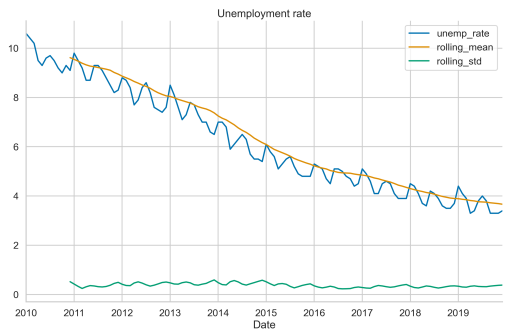

진짜 non-stationarity한지,</br>
monthly US unemployment rates 시계열 데이터의 statinarity 테스트

1. Import the libraries:

In [57]:
import pandas as pd
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.stattools import adfuller, kpss

2. Define a function for running the ADF test:

In [58]:
def adf_test(x):
    """
    Function for performing the Augmented Dickey-Fuller test for stationarity
    
    Null Hypothesis: time series is not stationary
    Alternate Hypothesis: time series is stationary

    Parameters
    ----------
    x : pd.Series / np.array
        The time series to be checked for stationarity
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the ADF test's results
    """
    
    indices = ["Test Statistic", "p-value",
               "# of Lags Used", "# of Observations Used"]
    
    adf_test = adfuller(x, autolag="AIC")
    results = pd.Series(adf_test[0:4], index=indices)
    
    for key, value in adf_test[4].items():
        results[f"Critical Value ({key})"] = value

    return results

※ ADF 테스트는 단위근(unit root)을 구하는 테스트라고한다...

※ adfuller 함수를 호출할 때 autolag="AIC"를 지정했으며, 이를 통해 Akaike Information Criterion(AIC)을 기반으로 자동으로 적절한 시차(lag)가 선택. 시차의 수를 수동으로 선택할 수도 있음

In [60]:
adf_test(df["unemp_rate"])

Test Statistic             -2.053411
p-value                     0.263656
# of Lags Used             12.000000
# of Observations Used    107.000000
Critical Value (1%)        -3.492996
Critical Value (5%)        -2.888955
Critical Value (10%)       -2.581393
dtype: float64

→ 분석
- ADF 테스트의 귀무 가설(null hypothesis): 시계열이 비정상적(non-stationary)이라는 것을 가정
- p-값이 0.26이므로(또는 테스트 통계량이 선택한 신뢰 수준의 임계값보다 크므로), 우리는 귀무 가설을 기각할 이유가 없음. 이는 시계열이 비정상적이라고 결론지을 수 있다는 의미
- 검정 통계량(-2.053411)은 이 임계값들과 비교했을 때, 어느 수준에서도 임계값보다 크므로, 1%, 5%, 10%의 유의 수준에서 모두 귀무 가설을 기각할 수 없음

In [64]:
# df.to_csv('D:/01_study/qaunt/python_for_Finance_Cookbook/unemp_data.csv')

3.  Define a function for running the KPSS test:

In [65]:
def kpss_test(x, h0_type="c"):
    """
    Function for performing the Kwiatkowski-Phillips-Schmidt-Shin test for stationarity

    Null Hypothesis: time series is stationary
    Alternate Hypothesis: time series is not stationary

    Parameters
    ----------
    x: pd.Series / np.array
        The time series to be checked for stationarity
    h0_type: str{"c", "ct"}
        Indicates the null hypothesis of the KPSS test:
            * "c": The data is stationary around a constant(default)
            * "ct": The data is stationary around a trend
    
    Returns
    -------
    results: pd.DataFrame
        A DataFrame with the KPSS test's results
    """
    
    indices = ["Test Statistic", "p-value", "# of Lags"]

    kpss_test = kpss(x, regression=h0_type)
    results = pd.Series(kpss_test[0:3], index=indices)
    
    for key, value in kpss_test[3].items():
        results[f"Critical Value ({key})"] = value

    return results

※ c값은 시계열이 수준 정상성(level-stationary)이라는 귀무 가설을 의미하고, ct값은 추세 정상성(trend-stationary)을 나타냄.
시계열에서 추세를 제거하면 수준 정상성이 된다는 것을 가정

In [67]:
kpss_test(df["unemp_rate"])

C:\Users\naare\AppData\Local\Temp\ipykernel_27372\1983588207.py:25: InterpolationWarning: The test statistic is outside of the range of p-values available in the
look-up table. The actual p-value is smaller than the p-value returned.

  kpss_test = kpss(x, regression=h0_type)


Test Statistic           1.799224
p-value                  0.010000
# of Lags                6.000000
Critical Value (10%)     0.347000
Critical Value (5%)      0.463000
Critical Value (2.5%)    0.574000
Critical Value (1%)      0.739000
dtype: float64

- KPSS 테스트의 귀무 가설(null hypothesis): 시계열이 정상적(stationary)이라는 가정
- 주어진 p-값이 0.01일 때, 또는 검정 통계량이 선택한 임계값보다 크다면, 우리는 귀무 가설을 기각
- 이는 대립 가설이 참일 가능성을 시사하며, 시계열이 비정상적(non-stationary)이라는 결론을 의미

4. Generate the ACF/PACF plots:

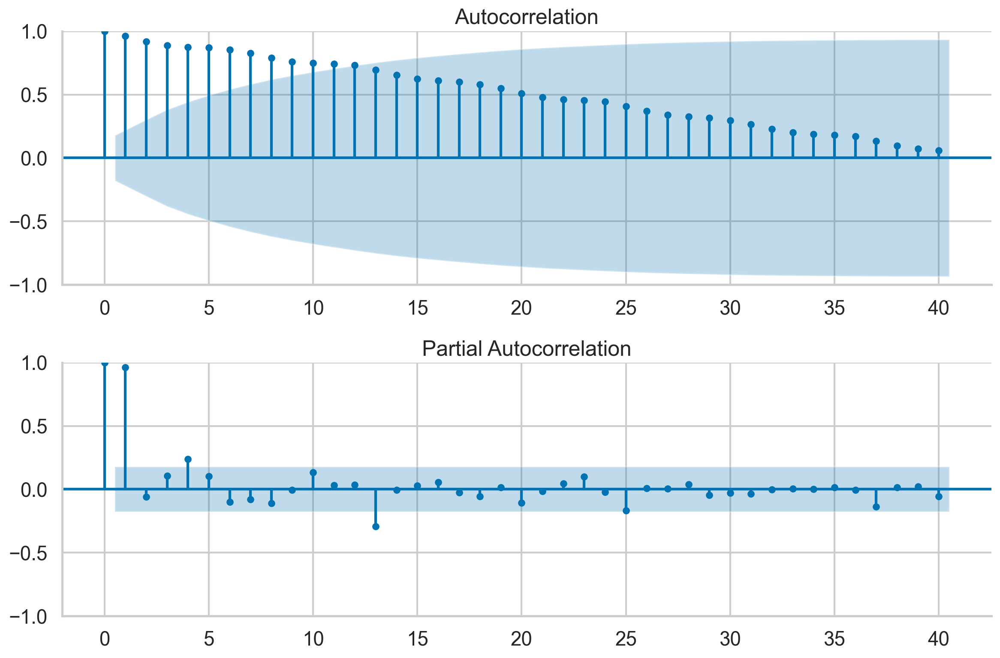

In [68]:
# 최대 40 시차(lags)까지의 상관관계를 보여주도록 설정
N_LAGS = 40
# 유의 수준(Significance level)을 0.05(즉, 5%)로 설정, 5% 이상의 확률로 우연에 의한 상관관계를 허용하지 않겠다는 의미
SIGNIFICANCE_LEVEL = 0.05

fig, ax = plt.subplots(2, 1)
plot_acf(df["unemp_rate"], ax=ax[0], lags=N_LAGS, 
         alpha=SIGNIFICANCE_LEVEL)
plot_pacf(df["unemp_rate"], ax=ax[1], lags=N_LAGS, 
          alpha=SIGNIFICANCE_LEVEL)

sns.despine()
plt.tight_layout()

※ 자기상관 함수(ACF)와 부분 자기상관 함수(PACF)는 시계열 데이터에서 관찰된 값들이 시간에 따라 얼마나 관련되어 있는지(상관관계)를 보여주는 중요한 도구
- ACF: 전체 시차에 대한 상관관계
- PACF: 시차 간의 직접적인 상관관계

※ 그래프 해석 방법
- 파란색 영역 안에 있는 값: 해당 시차에서의 자기상관 계수(ACF 또는 PACF)가 통계적으로 유의하지 않다는 것을 의미합니다. 즉, 무작위 변동에 의해 발생할 수 있는 상관관계이며, 특별한 패턴이 없다고 해석할 수 있습니다.
- 파란색 영역을 벗어난 값: 해당 시차에서 자기상관이 통계적으로 유의미함을 의미합니다. 즉, 이 시차에서 데이터 간에 강한 상관관계가 있다는 뜻입니다.

&nbsp;&nbsp;&nbsp;&nbsp;상관관계가 없다는 귀무 가설이 참일 경우, 자기상관 계수 값이 대부분 이 구간 내에 위치

→ 분석
- ACF 플롯에서 95% 신뢰 구간을 넘어서는 유의미한 자기상관이 관찰
- PACF 플롯에서는 시차 1과 시차 4에서 유의미한 자기상관이 존재

※ 위 모든 테스트와 자기상관 플롯에서 유의 수준(significance level)을 5%로 설정했으며, 이는 귀무 가설이 참일 때 귀무 가설을 기각할 확률

### There’s more…

□ statsmodels 라이브러리 대신 arch 라이브러리의 stationarity 테스트를 사용</br>
(GARCH models(Ch.9)에서 좀더 다룰 예정)

In [71]:
from arch.unitroot import ADF
adf = ADF(df["unemp_rate"])
print(adf.summary().as_text())

   Augmented Dickey-Fuller Results   
Test Statistic                 -2.053
P-value                         0.264
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: -3.49 (1%), -2.89 (5%), -2.58 (10%)
Null Hypothesis: The process contains a unit root.
Alternative Hypothesis: The process is weakly stationary.


□ arch 라이브러리에는 더 많은 정상성 테스트가 포함
- Zivot-Andrews 테스트 (statsmodels에도 제공됨)
- Phillips-Perron (PP) 테스트 (statsmodels에는 없음)

□ ADF와 KPSS 테스트의 잠재적인 단점
- 구조적 변화(structural break)의 가능성을 고려하지 않는다는 점</br>
  구조적 변화란 데이터 생성 과정에서 평균 또는 다른 매개변수의 갑작스러운 변화를 의미</br>
  ADF와 KPSS 테스트는 추세나 평균의 변화가 없는 일관된 데이터를 가정</br>
  추세나 평균의 급격한 변화가 항상 비정상성을 의미하지 않는다는 사실을 알고 있어야...
- Zivot-Andrews 테스트는 시계열에서 발생하는 단일 구조적 변화의 가능성을 허용하며, 그 발생 시점은 알 수 없는 상태에서 검정이 이루어짐

In [73]:
from arch.unitroot import ZivotAndrews
za = ZivotAndrews(df["unemp_rate"])
print(za.summary().as_text())

        Zivot-Andrews Results        
Test Statistic                 -2.551
P-value                         0.982
Lags                               12
-------------------------------------

Trend: Constant
Critical Values: -5.28 (1%), -4.81 (5%), -4.57 (10%)
Null Hypothesis: The process contains a unit root with a single structural break.
Alternative Hypothesis: The process is trend and break stationary.


→ 분석
- 해당 테스트의 p-값을 기반으로, 시계열이 정상적이지 않다는 귀무 가설을 기각할 수 없음. 비정상적(non-stationary)

## 6.3 Correcting for stationarity in time series

□ non-stationary 시계열 데이터를 stationary로 만들기 위한 방법
- Deflation: Customer Price Index(CPI)를 사용해 금전적 시계열에서 인플레이션 반영
- Natural algorithm 적용: exponential trend를 선형에 가깝게 만들고 분산을 줄이는 방법
- Differencing: 현재 관측값과 시차가 있는 이전 관측값의 차이를 계산하는 방법

□ 실습</br>
- 2000년~2010년 월별 금 가격 데이터: 해당 기간동안 지속적은 증가 trend → non-stationary

1. Import the libraries and authenticate and update the inflation data:

In [13]:
import pandas as pd
import numpy as np
import nasdaqdatalink
import cpi
from datetime import date
from chapter_6_utils import test_autocorrelation

nasdaqdatalink.ApiConfig.api_key = "K6ZEYjAnV7gDVuDhz3**"

In [29]:
data = nasdaqdatalink.get_table('ZACKS/FC', ticker='AAPL')

d:\01_study\myenv\Lib\site-packages\urllib3\connectionpool.py:1099: InsecureRequestWarning: Unverified HTTPS request is being made to host 'data.nasdaq.com'. Adding certificate verification is strongly advised. See: https://urllib3.readthedocs.io/en/latest/advanced-usage.html#tls-warnings
  warnings.warn(


In [ ]:
df = (
    nasdaqdatalink.get(dataset="WGC/GOLD_MONAVG_USD", 
                       start_date="2000-01-01", 
                       end_date="2010-12-31")
    .rename(columns={"Value": "price"})
    .resample("M")
    .last()
)

df.head()

→ 에러 발생 ㅡㅡ;;;

yfinance에서 금값으로 실습!!!

2.  Download the prices of gold and resample to monthly values:

In [18]:
import yfinance as yf

In [356]:
df = yf.download("GLD", start="2000-01-01", end="2010-12-31")

# 종가(Close) 데이터를 월별로 리샘플링 (마지막 값 사용)
df = df['Close'].resample('M').last()

# 인덱스를 'date', 종가를 'price'로 변경
df = df.reset_index().rename(columns={'Date': 'date', 'Close': 'price'})

# 데이터 확인
df.head()

[*********************100%***********************]  1 of 1 completed
C:\Users\naare\AppData\Local\Temp\ipykernel_11764\1199062015.py:4: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df = df['Close'].resample('M').last()


,date,price
0,2004-11-30,45.119999
1,2004-12-31,43.799999
2,2005-01-31,42.220001
3,2005-02-28,43.529999
4,2005-03-31,42.820000


In [49]:
df.date.unique()

<DatetimeArray>
['2004-11-30 00:00:00', '2004-12-31 00:00:00', '2005-01-31 00:00:00',
 '2005-02-28 00:00:00', '2005-03-31 00:00:00', '2005-04-30 00:00:00',
 '2005-05-31 00:00:00', '2005-06-30 00:00:00', '2005-07-31 00:00:00',
 '2005-08-31 00:00:00', '2005-09-30 00:00:00', '2005-10-31 00:00:00',
 '2005-11-30 00:00:00', '2005-12-31 00:00:00', '2006-01-31 00:00:00',
 '2006-02-28 00:00:00', '2006-03-31 00:00:00', '2006-04-30 00:00:00',
 '2006-05-31 00:00:00', '2006-06-30 00:00:00', '2006-07-31 00:00:00',
 '2006-08-31 00:00:00', '2006-09-30 00:00:00', '2006-10-31 00:00:00',
 '2006-11-30 00:00:00', '2006-12-31 00:00:00', '2007-01-31 00:00:00',
 '2007-02-28 00:00:00', '2007-03-31 00:00:00', '2007-04-30 00:00:00',
 '2007-05-31 00:00:00', '2007-06-30 00:00:00', '2007-07-31 00:00:00',
 '2007-08-31 00:00:00', '2007-09-30 00:00:00', '2007-10-31 00:00:00',
 '2007-11-30 00:00:00', '2007-12-31 00:00:00', '2008-01-31 00:00:00',
 '2008-02-29 00:00:00', '2008-03-31 00:00:00', '2008-04-30 00:00:00',
 '20

In [51]:
# df = yf.download("GLD", start="2000-01-01", end="2010-12-31")

# df = df['Close'].resample('M').last()
# df = df.reset_index().rename(columns={'Date': 'date', 'Close': 'price'})
df = df.set_index('date')

In [52]:
df.head()

,price
date,
2004-11-30,45.119999
2004-12-31,43.799999
2005-01-31,42.220001
2005-02-28,43.529999
2005-03-31,42.820000


2.1 Stationary test

test_autocorrelation 함수: ADF 및 KPSS 테스트, ACF/PACF 플롯을 결합한 기능을 제공</br>
→ 시계열 데이터의 정상성 여부를 평가 + 자기상관성을 시각적으로 확인

ADF test statistic: 0.46 (p-val: 0.98)
KPSS test statistic: 1.28 (p-val: 0.01)


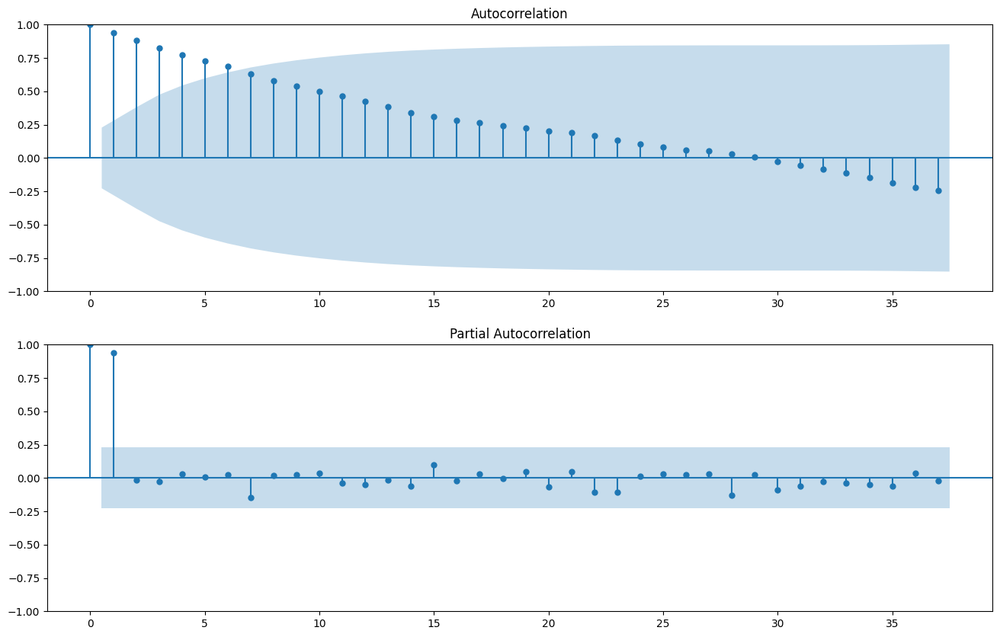

In [53]:
n_lags = min(40, len(df["price"]) // 2)

# ACF 및 PACF 테스트
fig = test_autocorrelation(df["price"], n_lags=n_lags)

→ 분석
- 시차 1에서 높은 상관관계를 보이고 있으므로 비정상적인 시계열이다...
- ADF 테스트의 귀무 가설(null hypothesis): 시계열이 비정상적(non-stationary)이라는 것을 가정
- KPSS 테스트의 귀무 가설(null hypothesis): 시계열이 정상적(stationary)이라는 가정


3. Deflate the gold prices (to the 2010-12-31 USD values) and plot the results
- 2010년 12월 31일의 물가를 기준으로 데이터를 조정하는 기능을 수행
- 물가 상승률(CPI)을 고려하여 금 가격을 비교 가능한 형태로 바꿔주는 것

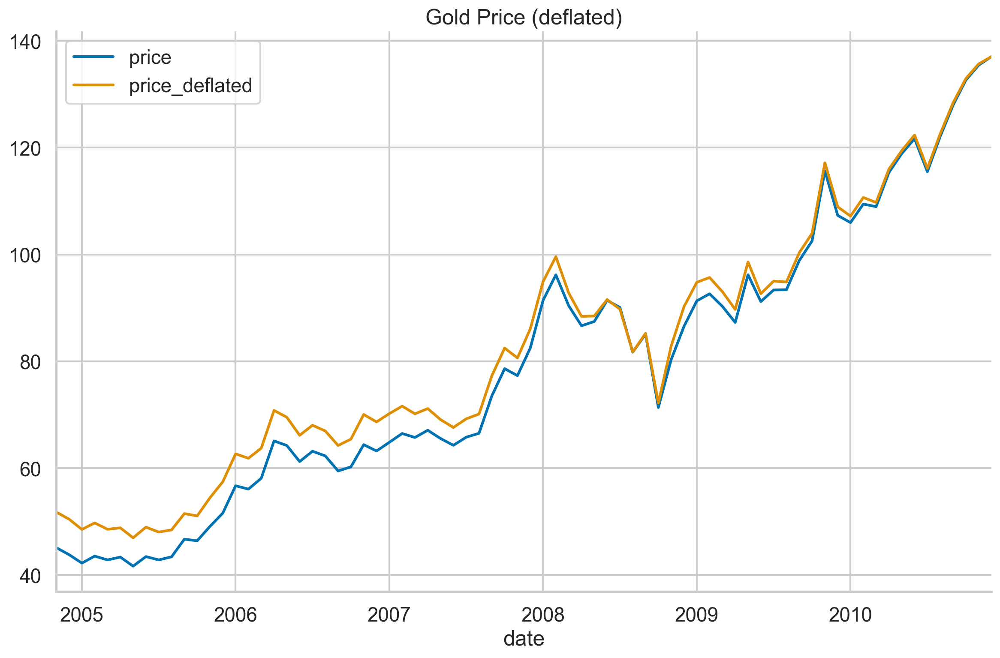

In [56]:
DEFL_DATE = date(2010, 12, 31)

df["dt_index"] = pd.to_datetime(df.index)
df["price_deflated"] = df.apply(
    lambda x: cpi.inflate(x["price"], x["dt_index"], DEFL_DATE), 
    axis=1
)

(
    df.loc[:, ["price", "price_deflated"]]
    .plot(title="Gold Price (deflated)")
)

sns.despine()
plt.tight_layout()

4. Apply the natural logarithm to the deflated series and plot it together with the rolling metrics:

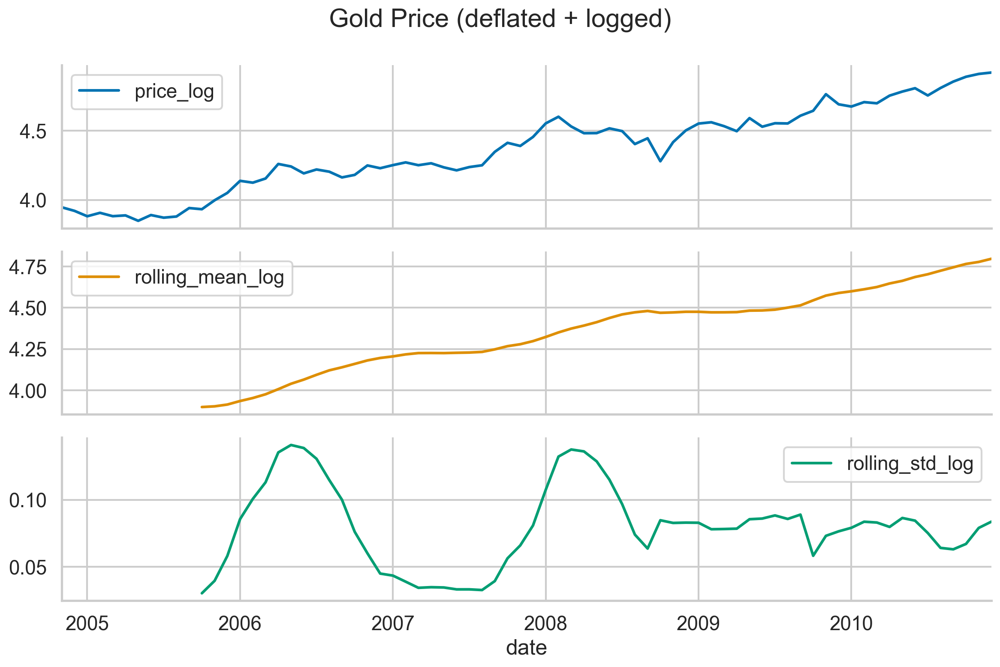

In [57]:
WINDOW = 12
selected_columns = ["price_log", "rolling_mean_log", 
                    "rolling_std_log"]

df["price_log"] = np.log(df.price_deflated)
df["rolling_mean_log"] = df.price_log.rolling(WINDOW) \
                           .mean()
df["rolling_std_log"] = df.price_log.rolling(WINDOW) \
                          .std()

(
    df[selected_columns]
    .plot(title="Gold Price (deflated + logged)", 
          subplots=True)
)

sns.despine()
plt.tight_layout()

→ 분석
- 로그 변환을 통해 기하급수적인 추세를 선형 추세로 만듦

5. Use the test_autocorrelation (helper function for this chapter) to investigate if the series 
became stationary:

ADF test statistic: -0.26 (p-val: 0.93)
KPSS test statistic: 1.27 (p-val: 0.01)


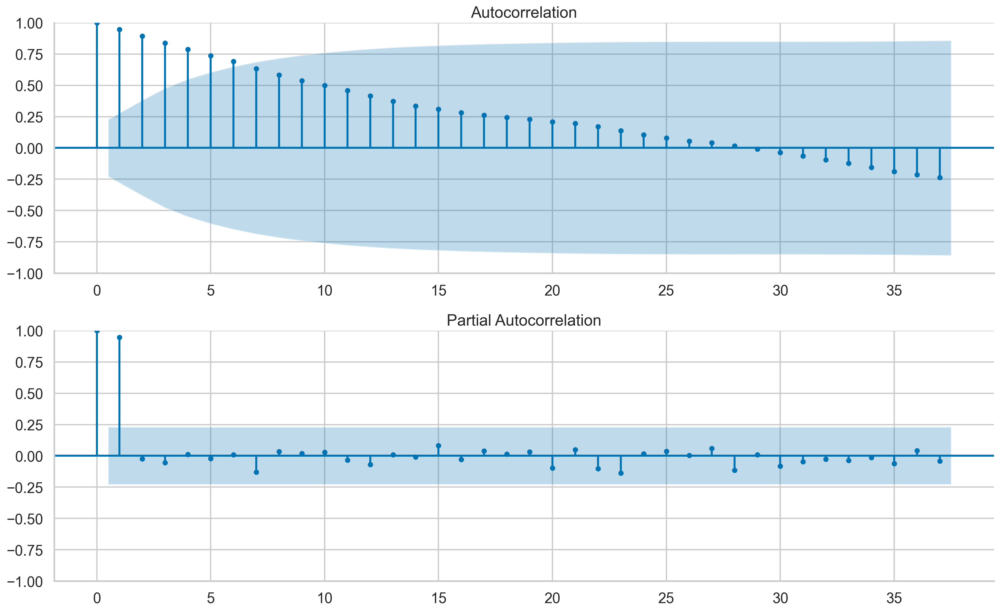

In [70]:
n_lags = min(40, len(df["price_log"]) // 2)
fig = test_autocorrelation(df["price_log"], n_lags=n_lags)

sns.despine()
plt.tight_layout()

→ 통계적 테스트와 ACF/PACF 플롯의 결과를 검토한 후, 디플레이션과 자연 로그 변환만으로는 월별 금 가격 시계열을 stationary로 만들기에 충분하지 않음

6. Apply differencing to the series and plot the results: 차분(differencing)을 적용한 후 결과를 플롯

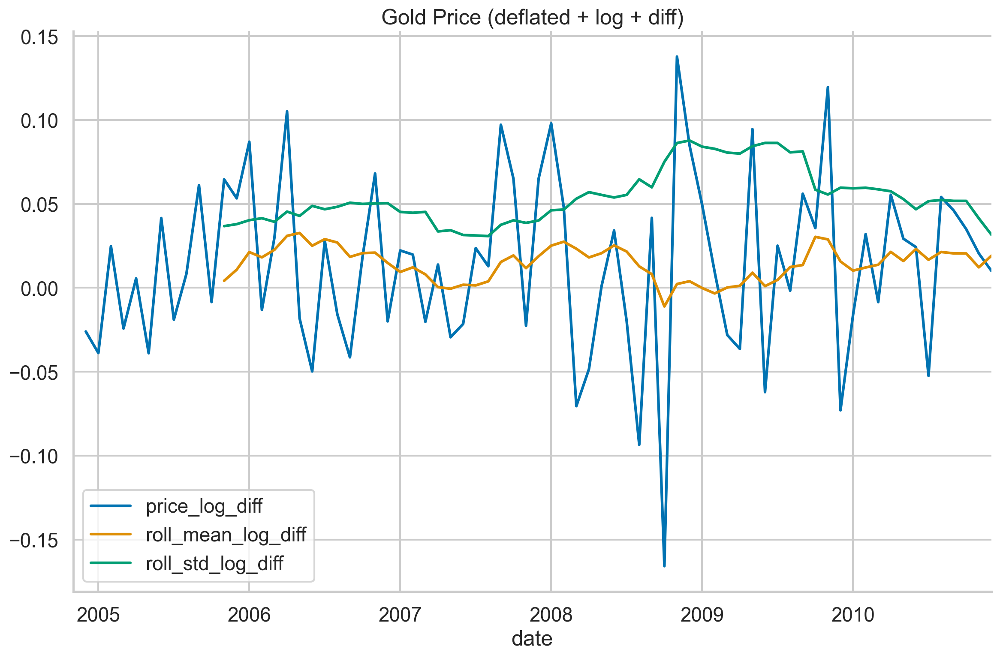

In [61]:
selected_columns = ["price_log_diff", "roll_mean_log_diff", 
                    "roll_std_log_diff"]

df["price_log_diff"] = df.price_log.diff(1)
df["roll_mean_log_diff"] = df.price_log_diff.rolling(WINDOW) \
                             .mean()
df["roll_std_log_diff"] = df.price_log_diff.rolling(WINDOW) \
                            .std()
df[selected_columns].plot(title="Gold Price (deflated + log + diff)")

sns.despine()
plt.tight_layout()

→ 분석
- 변환된 금 가격 시계열은 정상성을 가진 것처럼 보임. 0을 중심으로 진동하며, 뚜렷한 추세가 보이지 않고 분산도 대체로 일정

7. Test if the series became stationary:

ADF test statistic: -9.35 (p-val: 0.00)
KPSS test statistic: 0.06 (p-val: 0.10)


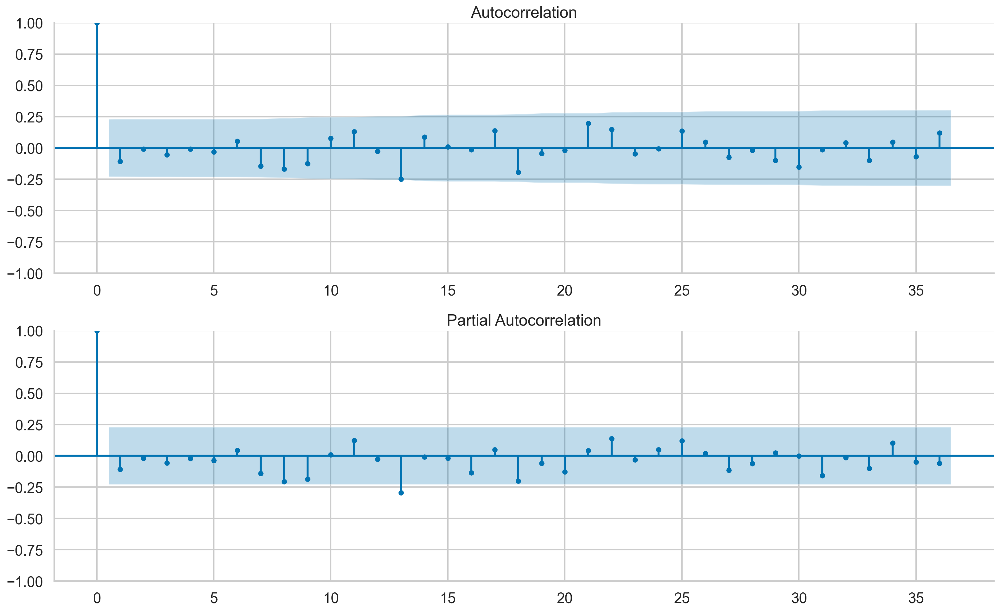

In [69]:
n_lags = min(40, len(df["price_log_diff"].dropna()) // 2)
fig = test_autocorrelation(df["price_log_diff"].dropna(), n_lags=n_lags)

sns.despine()
plt.tight_layout()

→ 분석:
- 1차 차분을 적용한 후, 5% 유의 수준에서 시계열이 정상성
- ACF/PACF 플롯에서는 시차 11, 22, 39에서 몇 가지 유의미한 값이 나타남. 계절성?, 오탐?
- 5% 유의 수준을 사용한다는 것은, 값의 5%는 수행된 과정에 자기상관 또는 부분 자기상관이 없더라도, 5%의 값이 95% 신뢰 구간 밖에 있을 수 있음을 의미

전체 정리
1. yfinance에서 월별 금 가격을 resamlpling
2. CPI 라이브러리로 미국 달러 인플레이션 반영해 시계열 데이터를 deflate
3. 자연 로그를 적용하여 기하급수적인 추세를 선형으로 변환
4. diff 메서드로 시차 값 계산

### There's more

□ 데이터셋에  seasonal  패턴이 존재할 경우, 이를 처리할 수 있는 몇 가지 잠재적인 해결책</br>
&nbsp;&nbsp;&nbsp;&nbsp;계절적 변동을 제거하거나 조정하는 방법
- Adjustment by differencing: 1차 차분 대신 고차 차분을 사용(예. 월별 데이터에 연간 계절성이 있다면 diff(12)를 사용하여 12개월 간의 차분을 적용)
- Adjustment by modeling: seasonality을 직접 모델링한 후 시계열에서 이를 제거</br>
-- seasonal_decompose 함수 또는 다른 more advanced automatic decomposition algorithm을 사용하여 계절 구성 요소를 추출</br>
가법 모델을 사용할 때는 계절성 구성 요소를 빼고, 승법 모델일 경우에는 나눗셈을 사용해 계절성을 제거</br>
-- np.polyfit() 함수를 사용하여 선택한 시계열에 다항식(polynomial)을 맞춘 후, 그 다항식을 원래 시계열에서 뺄 수도 있음

□ Box-Cox transformation: 시계열 데이터에 적용할 수 있는 또다른 adjustment 방식
- 다양한 지수 변환 함수를 결합하여 데이터의 분포를 정규 분포(Gaussian 분포)에 더 가깝게 만듦
- scipy 라이브러리의 boxcox 함수를 사용하여 자동으로 최적의 람다(lambda) 값을 찾을 수 있음
- 주의점: 시계열의 모든 값이 양수!!!(1차 차분이나, 시계열에 음수 값을 도입할 수 있는 다른 변환 후에는 이 변환을 사용하지 않아야함)

□ pmdarima 라이브러리: 
- 통계적 테스트를 사용하여 시계열을 stationary 상태로 만들기 위해 몇 번 차분해야 하는지를 결정하는 두 가지 함수 포함
- seasonality, seasonal stationarity도 제거
- stationarity검사 테스트 도구 포함: ADF, KPSS, and Phillips–Perron

In [72]:
from pmdarima.arima import ndiffs, nsdiffs

In [357]:
print(f"Suggested # of differences (ADF): {ndiffs(df['price'], test='adf')}")
print(f"Suggested # of differences (KPSS): {ndiffs(df['price'], test='kpss')}")
print(f"Suggested # of differences (PP): {ndiffs(df['price'], test='pp')}")

Suggested # of differences (ADF): 1
Suggested # of differences (KPSS): 1
Suggested # of differences (PP): 1


→ 1차 difference가 필요하므로 differencing을 하지 않은 시계열 데이터는 non-stationary하다...

※ KPSS 테스트에서는 어떤 귀무 가설을 검정할지 지정 가능(default: level stationarity, null="level")

- pmdarima 라이브러리는 two tests for seasonal differences 포함
    - Osborn, Chui, Smith, and Birchenhall (OCSB) 테스트: 계절성 차분이 필요한지를 검증하는 통계적 방법. 계절적 패턴을 모델링하거나 제거에 유용
    - Canova-Hansen (CH) 테스트: 계절성 차분이 필요한지 확인하는 방법, 계절적 데이터의 정상성을 평가하는 데 사용

In [74]:
print(f"Suggested # of differences (OSCB): {nsdiffs(df['price'], m=12, test='ocsb')}")
print(f"Suggested # of differences (CH): {nsdiffs(df['price'], m=12, test='ch')}")

Suggested # of differences (OSCB): 0
Suggested # of differences (CH): 0


→ 금 가격에는 seasonality가 없다는 결론을 제시

## 6.4 Modeling time series with exponential smoothing methods

□ 지수 평활법(Exponential Smoothing): classical forecasting model
- 과거 관측값의 weighted averages을 사용하여 예측을 수행
- 최근 관측값에 더 많은 비중을 두기 위해, 시간에 따라 가중치가 지수적으로 감소
- 추세나 계절성이 있는 비정상 데이터에 적합
- 계산이 많이 필요하지 않아 빠르며, 예측의 정확성 측면에서 비교적 신뢰할 만한 방법

- ETS 프레임워크(Error, Trend, Season)에 따라 세 가지 요소를 결합해 정의</br>
&nbsp;seasonal decomposition처럼 additively or multiplicatively 결합되거나, 모델에서 단순히 제외될 수 있음

□ Simple Exponential Smoothing(SES): 
- 추세나 계절성이 없는 시계열 데이터에 가장 적합
- 데이터 포인트가 적은 시계열에도 효과적으로 작동
- 최근 데이터에 더 많은 가중치를 부여하여 과거 데이터를 기반으로 미래 값을 예측하는 방식으로, 계산이 간단하고 빠름
- smoothing parameter a: 0~1
- a값이 클수록 최근 관측값에 더 많은 가중치가 부여
- a=0, 미래에 대한 예측이 훈련 데이터의 평균값과 같아짐
- a=1, 모든 예측값이 훈련 데이터의 마지막 관측값과 동일
- SES를 사용하여 생성된 예측값은 flat: 시간 지평선에 관계없이 모든 예측값은 동일하며, 이는 마지막 레벨 구성 요소에 해당하는 값과 같음</br>
따라서, 추세나 계절성이 없는 시계열에만 적합

□ Holt’s linear trend method(s Holt’s double exponential smoothing method):
- SES 확장 버전
- 시계열에 trend가 있을 때 이를 모델에 반영하기 위해 trend 구성 요소를 추가
- 데이터에 trend가 존재할 때 적합하지만, 여전히 seasonality을 처리할 수 없음
- 문제점: trend가 미래에도 일정하게 유지된다는 것으로, 이는 시간이 지남에 따라 trend가 무한히 증가하거나 감소한다는 것을 의미</br>
이를 해결하기위해 extension에서 감쇠(damping) 파라미터 𝜑를 추가해 추세를 완화</br>
추세가 미래에 일정한 값으로 수렴하게 만들어 추세가 평평하게 유지

※ 𝜑(파이) 값이 0.8보다 작은 경우는 드물며, 이는 작은 값일수록 감쇠 효과가 매우 강해지기 때문

최선의 방법은 𝜑 값을 0.8과 0.98 사이로 제한하는 것

𝜑 = 1일 경우, 감쇠가 없는 모델과 동일하게 작동

□ Holt-Winters' seasonal smoothing(Holt-Winters’ triple exponential smoothing)
- 시계열의 seasonality을 반영
- trend와 seasonality이 모두 존재하는 데이터에 가장 적합
- 이 모델에는 두 가지 변형이 있으며, additive 또는 multiplicative seasonalities을 가짐
- additive seasonality에서는 seasonal 변화가 시계열 전체에 걸쳐 거의 일정하게 유지
- multiplicative seasonality에서는 시간이 지남에 따라 변동폭이 비례적으로 변화

□ 실습
- 2010년부터 2018년까지의 데이터를 모델에 맞춘 후, 2019년의 실업률을 예측</br>
- exponential smoothing methods를 사용하여 미국 실업률 예측

In [358]:
df=pd.read_csv('D:/01_study/qaunt/python_for_Finance_Cookbook/unemp_data.csv')
df=df[['Date', 'unemp_rate']]
df=df.set_index('Date')
df.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


1. Import the libraries:

In [359]:
import pandas as pd
from datetime import date
from statsmodels.tsa.holtwinters import (ExponentialSmoothing, 
                                         SimpleExpSmoothing, 
                                         Holt)

2. Create the train/test split:

In [360]:
TEST_LENGTH = 12

df.index.freq = "MS"

df_train = df.iloc[:-TEST_LENGTH]
df_test = df.iloc[-TEST_LENGTH:]

In [361]:
df_train.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


In [182]:
df_train.tail()

,unemp_rate
Date,
2018-08-01,3.9
2018-09-01,3.6
2018-10-01,3.5
2018-11-01,3.5
2018-12-01,3.7


In [183]:
df_test.head()

,unemp_rate
Date,
2019-01-01,4.4
2019-02-01,4.1
2019-03-01,3.9
2019-04-01,3.3
2019-05-01,3.4


3. Fit 2 Simple Exponential Smoothing models and create forecasts:

In [195]:
ses_1 = SimpleExpSmoothing(df_train).fit(smoothing_level=0.5)
ses_forecast_1 = ses_1.forecast(TEST_LENGTH)

ses_2 = SimpleExpSmoothing(df_train).fit()
ses_forecast_2 = ses_2.forecast(TEST_LENGTH)

ses_1.params_formatted

d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
d:\01_study\myenv\Lib\site-packages\pandas\util\_decorators.py:213: EstimationWarning: Model has no free parameters to estimate. Set optimized=False to suppress this warning
  return func(*args, **kwargs)
d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


,name,param,optimized
smoothing_level,alpha,0.5,False
initial_level,l.0,10.6,False


In [196]:
ses_2.params_formatted

,name,param,optimized
smoothing_level,alpha,1.0,True
initial_level,l.0,10.6,False


In [197]:
ses_1.summary()

Dep. Variable:,unemp_rate,No. Observations:,108
Model:,SimpleExpSmoothing,SSE,15.110
Optimized:,False,AIC,-208.414
Trend:,None,BIC,-203.050
Seasonal:,None,AICC,-208.025
Seasonal Periods:,None,Date:,"Thu, 19 Sep 2024"
Box-Cox:,False,Time:,14:11:22
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,0.5000000,alpha,False
initial_level,10.600000,l.0,False


In [198]:
ses_2.summary()

Dep. Variable:,unemp_rate,No. Observations:,108
Model:,SimpleExpSmoothing,SSE,12.730
Optimized:,True,AIC,-226.922
Trend:,None,BIC,-221.558
Seasonal:,None,AICC,-226.534
Seasonal Periods:,None,Date:,"Thu, 19 Sep 2024"
Box-Cox:,False,Time:,14:11:23
Box-Cox Coeff.:,None,,
,coeff,code,optimized
smoothing_level,1.0000000,alpha,True
initial_level,10.600000,l.0,False


In [199]:
ses_1.model.params["smoothing_level"]

0.5

In [200]:
ses_2.model.params["smoothing_level"]

0.9999999850988341

In [201]:
ses_forecast_1

2019-01-01    3.635754
2019-02-01    3.635754
2019-03-01    3.635754
2019-04-01    3.635754
2019-05-01    3.635754
2019-06-01    3.635754
2019-07-01    3.635754
2019-08-01    3.635754
2019-09-01    3.635754
2019-10-01    3.635754
2019-11-01    3.635754
2019-12-01    3.635754
Freq: MS, dtype: float64

4. Combine the forecasts with the fitted values and plot them:

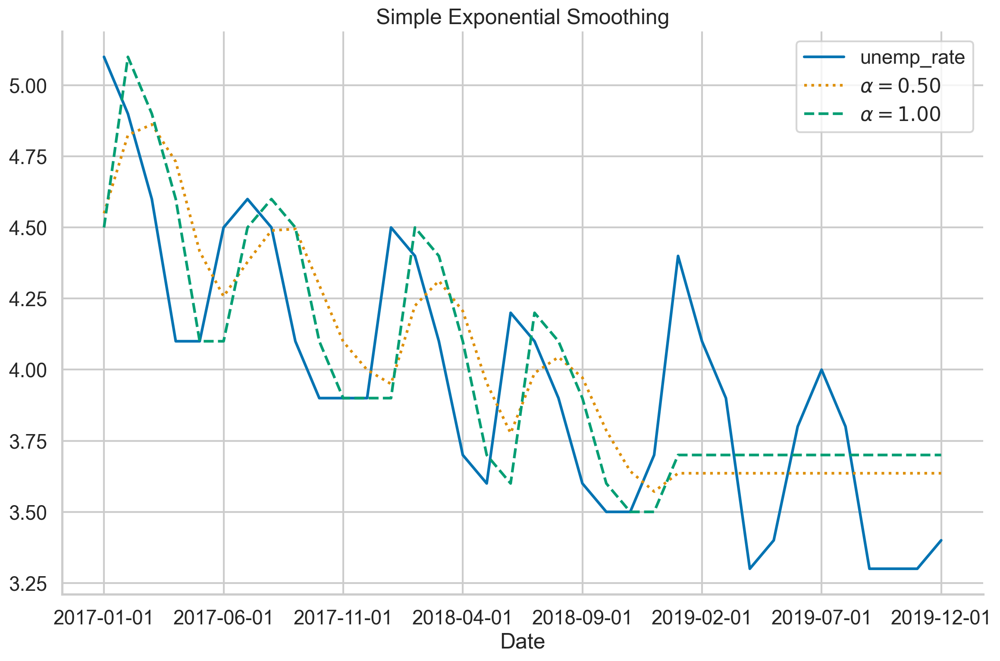

In [364]:
ses_df = df.copy()
# ses_df["ses_1"] = ses_1.fittedvalues.append(ses_forecast_1)
# ses_df["ses_2"] = ses_2.fittedvalues.append(ses_forecast_2)

a= ses_1.fittedvalues
b= ses_2.fittedvalues


ses_df["ses_1"] = pd.concat([a, ses_forecast_1], axis = 0).values
ses_df["ses_2"] = pd.concat([b, ses_forecast_2], axis = 0).values

opt_alpha_1 = ses_1.model.params["smoothing_level"]
opt_alpha = ses_2.model.params["smoothing_level"]

fig, ax = plt.subplots()
ses_df["2017":].plot(style=["-",":","--"], ax=ax,
                     title="Simple Exponential Smoothing")
labels = [
    "unemp_rate", 
    r"$\alpha={0:.2f}$".format(opt_alpha_1),
    r"$\alpha={0:.2f}$".format(opt_alpha), 
]
ax.legend(labels)

sns.despine()
plt.tight_layout()

→ 분석
- SES(단순 지수 평활법)의 특징이 관찰됨 → 예측이 평평한 선임을 확인
- 최적화 알고리즘에 의해 선택된 최적의 값이 1: 모델의 적합된 선이 실제 관측된 가격의 선을 오른쪽으로 이동시킨 것이며, 예측값은 단순히 마지막으로 관측된 값

In [223]:
ses_df

,unemp_rate,ses_1,ses_2
Date,,,
2010-01-01,10.6,10.600000,10.6
2010-02-01,10.4,10.600000,10.6
2010-03-01,10.2,10.500000,10.4
2010-04-01,9.5,10.350000,10.2
2010-05-01,9.3,9.925000,9.5
...,...,...,...
2019-08-01,3.8,3.635754,3.7
2019-09-01,3.3,3.635754,3.7
2019-10-01,3.3,3.635754,3.7


In [193]:
ses_1.fittedvalues

Date
2010-01-01    10.600000
2010-02-01    10.600000
2010-03-01    10.500000
2010-04-01    10.350000
2010-05-01     9.925000
                ...    
2018-08-01     4.044138
2018-09-01     3.972069
2018-10-01     3.786035
2018-11-01     3.643017
2018-12-01     3.571509
Length: 108, dtype: float64

In [231]:
a.index

Index(['2010-01-01', '2010-02-01', '2010-03-01', '2010-04-01', '2010-05-01',
       '2010-06-01', '2010-07-01', '2010-08-01', '2010-09-01', '2010-10-01',
       ...
       '2018-03-01', '2018-04-01', '2018-05-01', '2018-06-01', '2018-07-01',
       '2018-08-01', '2018-09-01', '2018-10-01', '2018-11-01', '2018-12-01'],
      dtype='object', name='Date', length=108)

In [224]:
ses_forecast_1.index

DatetimeIndex(['2019-01-01', '2019-02-01', '2019-03-01', '2019-04-01',
               '2019-05-01', '2019-06-01', '2019-07-01', '2019-08-01',
               '2019-09-01', '2019-10-01', '2019-11-01', '2019-12-01'],
              dtype='datetime64[ns]', freq='MS')

In [146]:
opt_alpha

0.9999999850988341

※ SimpleExpSmoothing(df_train).fit() 함수에서 smoothing_level 매개변수를 직접 설정하지 않으면, smoothing_level은 자동으로 최적화</br>
모델은 최적의 값을 계산하여 적용: 기본적으로 모델이 데이터를 분석한 후 최적의 평활 수준을 설정

5. Fit 3 variants of Holt's linear trend models and create forecasts:

In [232]:
# Holt's model with linear trend
hs_1 = Holt(df_train).fit()
hs_forecast_1 = hs_1.forecast(TEST_LENGTH)

# Holt's model with exponential trend
hs_2 = Holt(df_train, exponential=True).fit()
# equivalent to ExponentialSmoothing(df_train, trend="mul").fit()
hs_forecast_2 = hs_2.forecast(TEST_LENGTH)

# Holt's model with exponential trend and damping
hs_3 = Holt(df_train, exponential=False, 
            damped_trend=True).fit()
hs_forecast_3 = hs_3.forecast(TEST_LENGTH)

d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [233]:
hs_3.params_formatted

,name,param,optimized
smoothing_level,alpha,1.000000e+00,True
smoothing_trend,beta,5.419743e-14,True
initial_level,l.0,1.060000e+01,False
initial_trend,b.0,-1.948133e-01,False
damping_trend,phi,9.740666e-01,True


6. Plot the original series together with the models' forecasts:

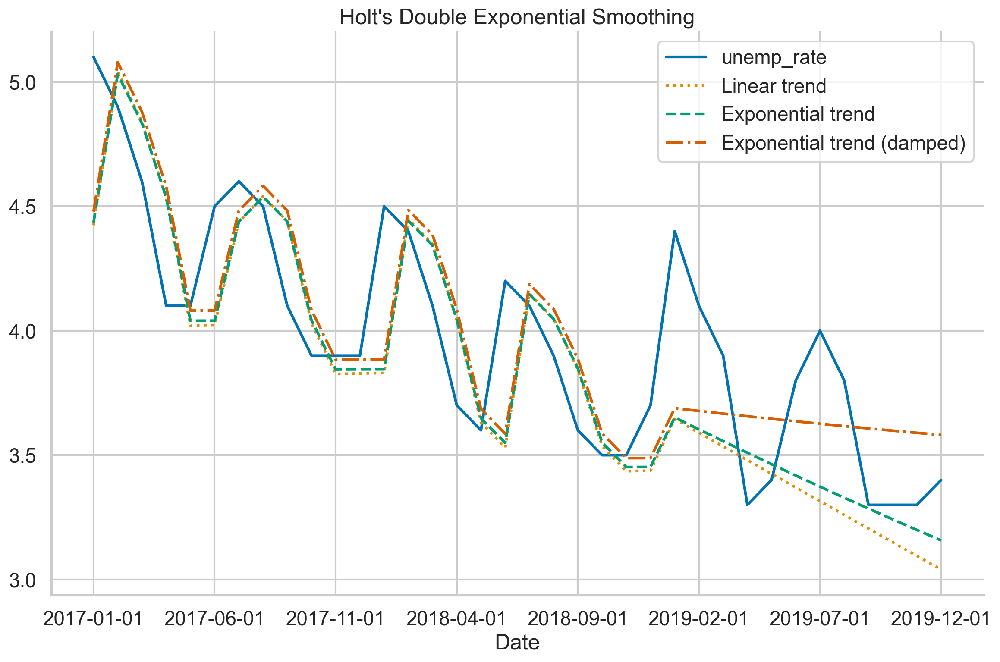

In [235]:
hs_df = df.copy()

a= hs_1.fittedvalues
b= hs_2.fittedvalues
c= hs_3.fittedvalues


hs_df["hs_1"] = pd.concat([a, hs_forecast_1], axis = 0).values
hs_df["hs_2"] = pd.concat([b, hs_forecast_2], axis = 0).values
hs_df["hs_3"] = pd.concat([c, hs_forecast_3], axis = 0).values

# hs_df["hs_1"] = hs_1.fittedvalues.append(hs_forecast_1)
# hs_df["hs_2"] = hs_2.fittedvalues.append(hs_forecast_2)
# hs_df["hs_3"] = hs_3.fittedvalues.append(hs_forecast_3)

fig, ax = plt.subplots()
hs_df["2017":].plot(style=["-",":","--", "-."], ax=ax,
                    title="Holt's Double Exponential Smoothing")
labels = [
    "unemp_rate", 
    "Linear trend",
    "Exponential trend",
    "Exponential trend (damped)",
]
ax.legend(labels)

sns.despine()
plt.tight_layout()

→ 분석
- SES(단순 지수 평활법) 예측과 비교했을 때, 예측 선이 더 이상 평평하지 않다는 개선된 점을 관찰
- SES의 경우 알파(α, smoothing_level)라는 단일 매개변수를 최적화하고,
- 베타(β, smoothing_trend)와 경우에 따라 파이(φ, damping_trend)도 함께 최적화하고 있다는 점 확인

Holt-Winters와 같은 방법에서는 더 많은 매개변수를 최적화하여 더욱 복잡한 추세와 계절성 패턴을 포착 가능

7. Fit two variants of Holt-Winters’ Triple Exponential Smoothing models and calculate the forecasts:

In [236]:
SEASONAL_PERIODS = 12

# Holt-Winters' model with exponential trend
hw_1 = ExponentialSmoothing(df_train, 
                            trend="mul", 
                            seasonal="add", 
                            seasonal_periods=SEASONAL_PERIODS).fit()
hw_forecast_1 = hw_1.forecast(TEST_LENGTH)

# Holt-Winters' model with exponential trend and damping
hw_2 = ExponentialSmoothing(df_train, 
                            trend="mul", 
                            seasonal="add", 
                            seasonal_periods=SEASONAL_PERIODS, 
                            damped_trend=True).fit()
hw_forecast_2 = hw_2.forecast(TEST_LENGTH)

d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)
d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


In [237]:
hw_2.params_formatted

,name,param,optimized
smoothing_level,alpha,6.329427e-01,True
smoothing_trend,beta,6.008681e-18,True
smoothing_seasonal,gamma,7.477774e-17,True
initial_level,l.0,8.210258e+00,True
initial_trend,b.0,1.009640e+00,True
damping_trend,phi,9.727863e-01,True
initial_seasons.0,s.0,2.529773e+00,True
initial_seasons.1,s.1,2.400775e+00,True
initial_seasons.2,s.2,2.193823e+00,True
initial_seasons.3,s.3,1.686548e+00,True


8. Plot the original series together with the models’ results

<>:19: SyntaxWarning: invalid escape sequence '\p'
<>:19: SyntaxWarning: invalid escape sequence '\p'
C:\Users\naare\AppData\Local\Temp\ipykernel_11764\120050550.py:19: SyntaxWarning: invalid escape sequence '\p'
  f"Seasonal Smoothing (damped with $\phi={phi:.2f}$)"


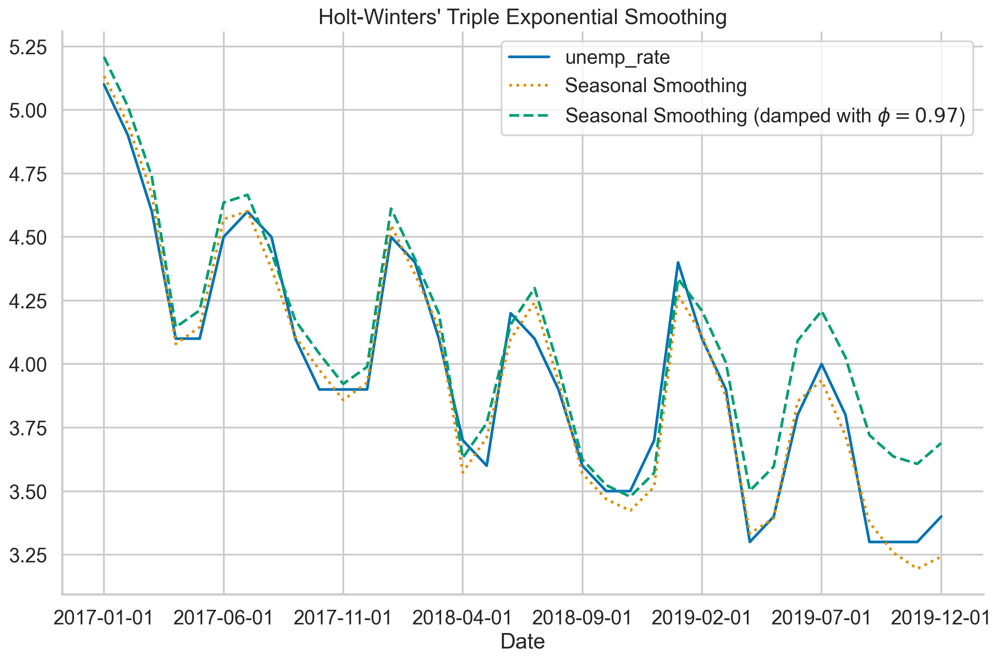

In [238]:
hw_df = df.copy()

d= hw_1.fittedvalues
e= hw_2.fittedvalues

hw_df["hw_1"] = pd.concat([d, hw_forecast_1], axis = 0).values
hw_df["hw_2"] = pd.concat([e, hw_forecast_2], axis = 0).values

fig, ax = plt.subplots()
hw_df["2017":].plot(
    style=["-",":","--"], ax=ax,
    title="Holt-Winters' Triple Exponential Smoothing"
)
phi = hw_2.model.params["damping_trend"]

labels = [
    "unemp_rate", 
    "Seasonal Smoothing",
    f"Seasonal Smoothing (damped with $\phi={phi:.2f}$)"
]
ax.legend(labels)

sns.despine()
plt.tight_layout()

→ 분석:
- 계절적 패턴이 예측값에 포함되었음을 확인</br>
Holt-Winters와 같은 계절성 추세 모델이 계절적 변동을 포착하여 이를 예측에 반영

#### 정리
1. SimpleExpSmoothing 클래스를 사용하여 두 개의 SES 모델을 훈련데이터로 fit</br>
  평활 계수(smoothing_level)의 값을 수동으로 설정할 수도 있었지만, statsmodels가 최적의 값을 자동으로 찾아주도록 설정하는 것이 일반적으로 좋은 방법
  (최적화 과정은 잔차(오차)의 제곱합을 최소화하는 방식으로 수행)
2. forecast 메서드를 사용하여 예측을 생성했으며, 예측을 위한 기간은 테스트 세트의 길이와 동일하게 설정
3. fitted 모델의 fittedvalues 속성을 통해 얻은 적합된 값과 예측값을 pandas DataFrame에 결합하고, 이를 관측된 실업률과 함께 시각화
4. Holt 클래스를 사용하여 Holt의 선형 추세 모델을 fit</br>
   기본적으로 모델 내의 추세는 선형이지만, exponential=True를 지정하면 지수형 추세로 만들 수 있으며, damped_trend=True로 감쇠 효과를 추가할 수 있음
   SES의 경우와 마찬가지로, fit 메서드를 인자 없이 호출하면 최적화 과정이 실행되어 매개변수의 최적값이 결정됨
5. fitted 값과 예측값을 모두 DataFrame에 넣고 결과를 시각화
6. 두 가지 Holt-Winters의 삼중 지수 평활법(Triple Exponential Smoothing) 모델 변형을 추정</br>
ExponentialSmoothing 클래스를 사용하여 seasonal과 seasonal_periods 인자를 추가함으로써 모델을 조정</br>
ETS(오차, 추세, 계절성) 모델 분류에 따르면, 해당 모델이 가법적 계절성을 가지고 있음을 명시 필요</br>
7. fitted 값과 예측값을 DataFrame에 넣고 다시 결과를 선 그래프로 시각화

Holt-Winters 모델은 추세와 계절성을 모두 포함하는 시계열 데이터를 효과적으로 처리하며, ExponentialSmoothing 클래스의 매개변수를 사용하여 다양한 변형을 적용 가능

※ ExponentialSmoothing 클래스를 인스턴스화할 때, 추가적으로 use_boxcox 인자를 전달하여 분석 중인 시계열 데이터에 자동으로 Box-Cox 변환을 적용할 수 있음</br>
또 다른 방법으로는 동일한 인자에 "log" 문자열을 전달하여 로그 변환을 사용 가능

### There's more

위에서는 다양한 exponential smoothing models을 사용하여 월별 실업률을 예측할 때,
직접(수동으로) 모델의 종류를 지정했고, 대부분의 경우 statsmodels 라이브러리를 사용하여 최적의 매개변수를 자동으로 찾도록 설정함

 □ AutoETS라는 절차를 사용하여 일부 제약 조건을 바탕으로 최적의 ETS 모델 변형을 찾는 것</br>
 &nbsp;&nbsp; 모델 선택을 자동화하여 다양한 매개변수를 시도하는 수동 작업을 줄이는 데 유용


 □ AutoETS 절차는 sktime 라이브러리에서 사용할 수 있으며, 이 라이브러리는 scikit-learn에서 영감을 받아 개발되었지만, 시계열 분석 및 예측에 중점을 둔 라이브러리/프레임워크

□ 실습: to find the best ETS model using the AutoETS approach

---------------------------------------

## ★ continue on Colab Start

Colab 실습을 위한 데이터 transfer

In [265]:
hw_df.to_csv(('D:/01_study/qaunt/python_for_Finance_Cookbook/hw_df.csv'))

In [266]:
phi

0.9727862595099785

In [270]:
df_test

,unemp_rate
Date,
2019-01-01,4.4
2019-02-01,4.1
2019-03-01,3.9
2019-04-01,3.3
2019-05-01,3.4
2019-06-01,3.8
2019-07-01,4.0
2019-08-01,3.8
2019-09-01,3.3


In [268]:
hw_forecast_1.to_csv(('D:/01_study/qaunt/python_for_Finance_Cookbook/hw_forecast_1.csv'))

In [269]:
hw_forecast_2.to_csv(('D:/01_study/qaunt/python_for_Finance_Cookbook/hw_forecast_2.csv'))

In [271]:
df_test.to_csv(('D:/01_study/qaunt/python_for_Finance_Cookbook/df_test.csv'))

## ★ continue on Colab End

---------------------------------------------

## 6.5 Modeling time series with ARIMA class models

□ ARIMA(Autoregressive Integrated Moving Average)
- 시계열 데이터를 분석하고 예측하는 데 사용되는 통계 모델의 한 종류
- 시계열 데이터에 있는 autocorrelations 설명하는 것을 목표
- ARMA 모델의 확장판
- integration component: 시계열의 stationarity를 보장하는 역할
- exponential smoothing models과 달리 ARIMA 모델은 시계열 데이터가 stationary해야 함

ㅁ AR (autoregressive) model:
- 현재 관측값과 그 이전 p개의 시차 값들 간의 관계를 사용
- 금융에서 자기회귀 모델은 모멘텀과 평균 회귀 효과를 설명

ㅁ I (integration):
- 원래의 시계열에 차분을 적용하는 것을 의미(이전 기간의 값을 현재 값에서 빼는 방식)</br>
시계열을 stationary 상태로 만듦
- 매개변수 d(called degree/order of differencing): 차분을 몇 번 적용해야 하는지를 나타냄

ㅁ MA (moving average) model:
- 현재 관측값과 마지막 q개의 관측값에서 발생한 백색 잡음 항목(충격) 간의 관계를 사용
- 금융에서 이동 평균 모델은 관측된 시계열에 영향을 미치는 예측할 수 없는 충격(잔차에서 관찰된)을 설명</br>
schocks의 예. 자연 재해나 특정 기업과 관련된 속보
- MA 모델의 백색 잡음 항목은 관찰할 수 없음.</br>
ARIMA 모델을 ordinary least squares(OLS) 대신 MLE(Maximum Likelihood Estimation)와 같은 반복 추정 방법을 사용

※ OLS는 이 비선형적 관계를 처리하지 못하지만(OLS는 선형 회귀 모델에서 적합한 방법), MLE는 반복 추정을 통해 비선형 관계를 처리할 수 있음
- OLS는 관찰된 데이터와 예측된 값 사이의 차이를 최소화하는 방법
- 오차 항들은 데이터에서 직접 관측되지 않기 때문에 "숨겨진 변수"(백색 잡음)로 간주됨</br>
 OLS는 숨겨진 변수를 직접 다룰 수 없기 때문에, 이 변수들을 반복적으로 추정하는 MLE가 더 적합
- MLE는 주어진 데이터에서 파라미터가 가장 그럴듯한 값을 찾는 방식



ㅁ ARIMA (p,d,q) 표기법
- 불필요한 복잡성을 피하고 훈련 데이터에 과적합하는 것을 방지하기 위해 ARIMA 매개변수의 값을 가능한 작게 유지하는 것이 좋음
- 경험적 규칙은 d 값을 2 이하로 유지하는 것이며, p와 q 값은 5를 넘지 않도록 설정하는 것
- 대부분의 경우 AR(자기회귀) 또는 MA(이동평균) 중 하나가 모델에서 주도적인 역할을 하게되며 다른 하나는 상대적으로 작은 값이 설정될 가능성이 큼
- 매개변수를 적절하게 설정하는 것이 모델의 복잡성을 줄이고 성능을 최적화하는 데 도움

※ ARIMA Model Special Cases, hyperparameters setting

- **ARIMA (0,0,0)**: White noise
- **ARIMA (0,1,0) without constant**: Random walk
- **ARIMA (p,0,q)**: ARMA(p, q)
- **ARIMA (p,0,0)**: AR(p) model
- **ARIMA (0,0,q)**: MA(q) model
- **ARIMA (0,1,2)**: Damped Holt’s model
- **ARIMA (0,1,1) without constant**: SES (Simple Exponential Smoothing) model
- **ARIMA (0,2,2)**: Holt’s linear method with additive errors

AR, I, MA

ㅁ ARIMA 특징
- ARIMA 모델은 여전히 산업 현장에서 매우 인기
- 특히 짧은 기간의 예측에서 거의 state of art performance 보여줌, 특히 작은 데이터셋을 다룰 때 유용</br>
cf. 머신러닝, 딥러닝은 성능 내기 어려움
- 금융 시장에서 ARIMA 모델의 한 가지 알려진 단점</br>
: 대부분의 금융 자산에서 관찰되는 **변동성 클러스터링(volatility clustering)**을 포착하지 못한다는 점</br>
(금융 자산에서 변동성이 갑자기 커지거나 작아지는 경향을 설명하지 못하는 한계로, 이를 해결하기 위해 GARCH 모델과 같은 다른 모델들이 더 선호되기도...)

ㅁ 실습
- 2010년부터 2019년까지의 미국 월별 실업률 데이터를 사용

In [272]:
df=pd.read_csv('D:/01_study/qaunt/python_for_Finance_Cookbook/unemp_data.csv')

In [275]:
df=df[['Date', 'unemp_rate']]
df=df.set_index('Date')

In [276]:
df.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


1. Import the libraries:

In [277]:
import pandas as pd
import numpy as np
from statsmodels.tsa.arima.model import ARIMA
from chapter_6_utils import test_autocorrelation
from sklearn.metrics import mean_absolute_percentage_error

2. Create the train/test split

In [278]:
TEST_LENGTH = 12
df_train = df.iloc[:-TEST_LENGTH]
df_test = df.iloc[-TEST_LENGTH:]

3. Apply the log transformation and calculate the first differences:
- 훈련 데이터에 로그 변환 및 1차 differencing

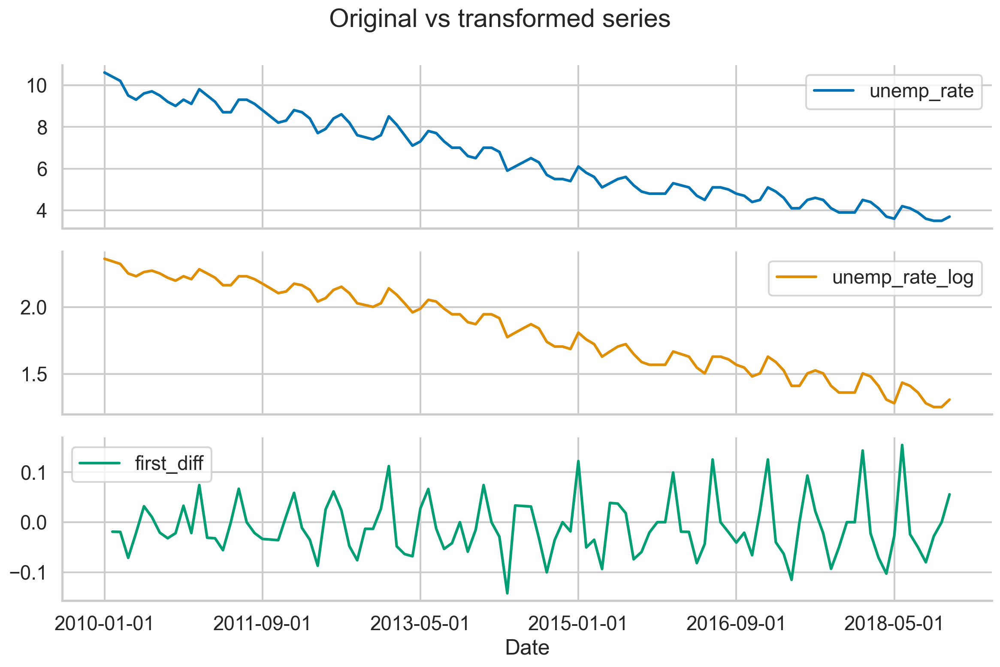

In [279]:
df_train["unemp_rate_log"] = np.log(df_train["unemp_rate"])
df_train["first_diff"] = df_train["unemp_rate_log"].diff()

df_train.plot(subplots=True, 
              title="Original vs transformed series")

sns.despine()
plt.tight_layout()

→ 로그 변환된 시계열의 1차 차분이 정상적(stationary)임을 확인할 수 있음

4. Test the stationarity of the differenced series:
- 로그 변환된 시계열의 1차 차분에 대해 정상성을 테스트

ADF test statistic: -2.97 (p-val: 0.04)
KPSS test statistic: 0.04 (p-val: 0.10)


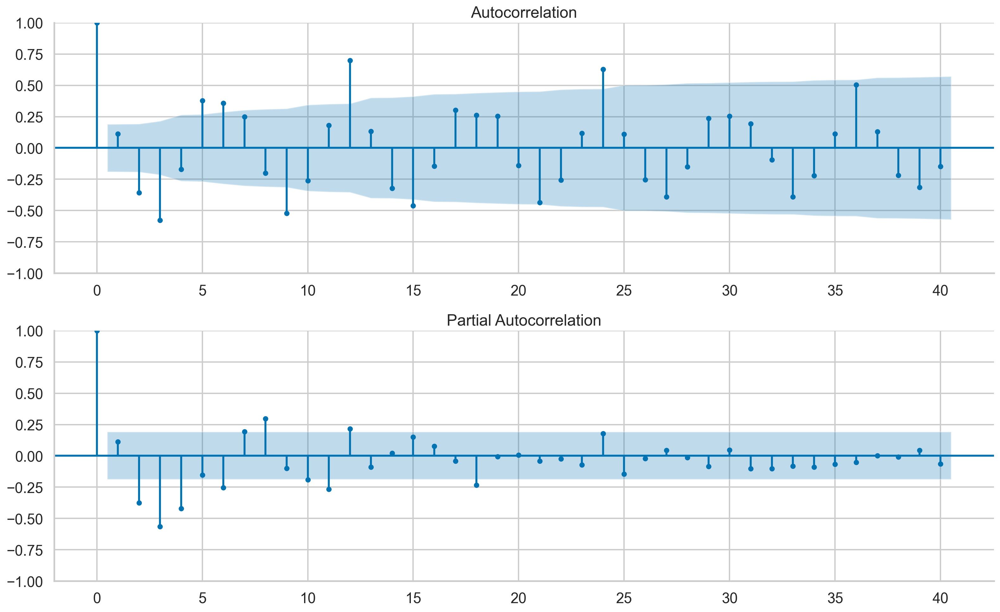

In [280]:
fig = test_autocorrelation(df_train["first_diff"].dropna())

sns.despine()
plt.tight_layout()

→ 분석
- 5% 유의 수준에서 해당 시계열이 stationary라는 것을 확인
- ACF/PACF 플롯을 보면, 12 및 24 시차에서 뚜렷한 연간 계절 패턴이 나타나는 것을 확인

5. Fit two different ARIMA models and print their summaries:

In [282]:
arima_111 = ARIMA(
    df_train["unemp_rate_log"], order=(1, 1, 1),freq='MS'
).fit()
arima_111.summary()

d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:         unemp_rate_log   No. Observations:                  108
Model:                 ARIMA(1, 1, 1)   Log Likelihood                 157.020
Date:                Thu, 19 Sep 2024   AIC                           -308.040
Time:                        18:26:39   BIC                           -300.021
Sample:                    01-01-2010   HQIC                          -304.789
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.5541      0.401      1.381      0.167      -0.232       1.340
ma.L1         -0.7314      0.306     -2.391      0.017      -1.331      -0.132
sigma2         0.0031      0.000      6.823      0.000       0.002       0.004
===================================================================================
Ljung-Box (L1) (Q):                   2.55   Jarque-Bera (JB):                 9.59
Prob(Q):                              0.11   Prob(JB):                         0.01
Heteroskedasticity (H):               2.33   Skew:                             0.64
Prob(H) (two-sided):                  0.01   Kurtosis:                         3.71
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

1차 차분 후에 시계열이 정상성을 띠었으므로, Integration 차수 d=1임을 알 수 있음

- AR(1): 자기회귀 항의 차수가 1이라는 의미로, 이전 관측값 1개가 현재 관측값에 영향을 미친다는 뜻
- I(1): 차분을 한 번 적용하여 데이터를 정상성(stationarity) 상태로 만든다는 것
- MA(1): 이동 평균 항의 차수가 1임을 의미하며, 이전 시점의 오차 1개가 현재 관측값에 영향을 미친다는 뜻

In [284]:
arima_212 = ARIMA(
    df_train["unemp_rate_log"], order=(2, 1, 2),freq='MS'
).fit()
arima_212.summary()

d:\01_study\myenv\Lib\site-packages\statsmodels\tsa\base\tsa_model.py:473: ValueWarning: No frequency information was provided, so inferred frequency MS will be used.
  self._init_dates(dates, freq)


<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:         unemp_rate_log   No. Observations:                  108
Model:                 ARIMA(2, 1, 2)   Log Likelihood                 196.744
Date:                Thu, 19 Sep 2024   AIC                           -383.488
Time:                        18:29:41   BIC                           -370.124
Sample:                    01-01-2010   HQIC                          -378.070
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.9952      0.014     69.587      0.000       0.967       1.023
ar.L2         -0.9893      0.014    -69.969      0.000      -1.017      -0.962
ma.L1         -1.1436     36.824     -0.031      0.975     -73.318      71.031
ma.L2          1.0000     64.402      0.016      0.988    -125.225     127.225
sigma2         0.0014      0.088      0.016      0.988      -0.171       0.174
===================================================================================
Ljung-Box (L1) (Q):                  11.31   Jarque-Bera (JB):                 3.24
Prob(Q):                              0.00   Prob(JB):                         0.20
Heteroskedasticity (H):               1.99   Skew:                             0.40
Prob(H) (two-sided):                  0.04   Kurtosis:                         3.28
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

6. Combine the fitted values with the predictions:

- 원래 시계열 데이터를 두 모델의 예측값과 결합
- ARIMA 모델에서 적합된 값을 추출하고 2019년에 대한 예측값을 시계열 끝에 추가
- 모델을 로그 변환된 시계열 데이터에 맞췄기 때문에, 예측된 값을 np.exp 함수를 사용하여 로그 변환을 되돌림

In [ ]:
d= hw_1.fittedvalues
e= hw_2.fittedvalues

hw_df["hw_1"] = pd.concat([d, hw_forecast_1], axis = 0).values
hw_df["hw_2"] = pd.concat([e, hw_forecast_2], axis = 0).values


In [290]:
df["pred_111_log"] = pd.concat([arima_111.fittedvalues, arima_111.forecast(TEST_LENGTH)]).values
df["pred_111"] = np.exp(df["pred_111_log"])

df["pred_212_log"] = pd.concat([arima_212.fittedvalues, arima_212.forecast(TEST_LENGTH)]).values
df["pred_212"] = np.exp(df["pred_212_log"])

※ 시계열 데이터에서 0값이 발생할 수 있는 경우, np.log1p와 np.exp1m을 사용하는 것이 더 안전

In [291]:
# df["pred_111_log"] = (
#     arima_111
#     .fittedvalues
#     .append(arima_111.forecast(TEST_LENGTH))
# )
# df["pred_111"] = np.exp(df["pred_111_log"])

# df["pred_212_log"] = (
#     arima_212
#     .fittedvalues
#     .append(arima_212.forecast(TEST_LENGTH))
# )
# df["pred_212"] = np.exp(df["pred_212_log"])
df.head()

,unemp_rate,pred_111_log,pred_111,pred_212_log,pred_212
Date,,,,,
2010-01-01,10.6,0.000000,1.000000,0.000000,1.000000
2010-02-01,10.4,2.360854,10.600000,2.360854,10.600000
2010-03-01,10.2,2.344579,10.428879,2.337673,10.357109
2010-04-01,9.5,2.327491,10.252185,2.324158,10.218073
2010-05-01,9.3,2.266963,9.650047,2.256345,9.548130


In [292]:
df.tail()

,unemp_rate,pred_111_log,pred_111,pred_212_log,pred_212
Date,,,,,
2019-08-01,3.8,1.308395,3.700230,1.340841,3.822255
2019-09-01,3.3,1.308395,3.700230,1.272399,3.569404
2019-10-01,3.3,1.308395,3.700231,1.222022,3.394042
2019-11-01,3.3,1.308395,3.700231,1.239599,3.454229
2019-12-01,3.4,1.308395,3.700231,1.306932,3.694819


In [295]:
#  The number of initial periods during which the loglikelihood is not recorded. Default is 0.
# 초기 관측값을 무시하고 로그 가능도를 계산할 기간을 설정
# 0이면 초기 기간을 무시하지 않고 모든 로그 가능도를 계산
arima_111.loglikelihood_burn

1

→ ARIMA 모델에서 로그 가능도를 계산할 때 첫 번째 기간의 데이터를 무시하고 로그 가능도를 계산한다는 뜻

초기 상태로 인해 발생할 수 있는 로그 가능도 왜곡을 방지

In [298]:
# 확산 상태(diffuse state)**를 계산하는 동안 관측된 데이터 포인트의 수
arima_111.nobs_diffuse

0

ARIMA 모델에서 **확산 상태(diffuse state)**가 없다는 것을 의미합니다. 즉, 초기 상태에 대한 불확실성 없이 모델이 정상적으로 초기화되었다는 뜻

모델의 초기 추정치가 확실하고 불확실성이 적은 경우에는 nobs_diffuse가 0으로 설정

7. Plot the forecasts and calculate the MAPEs:

예측값을 시각화하고 평균 절대 백분율 오차(MAPE)를 계산

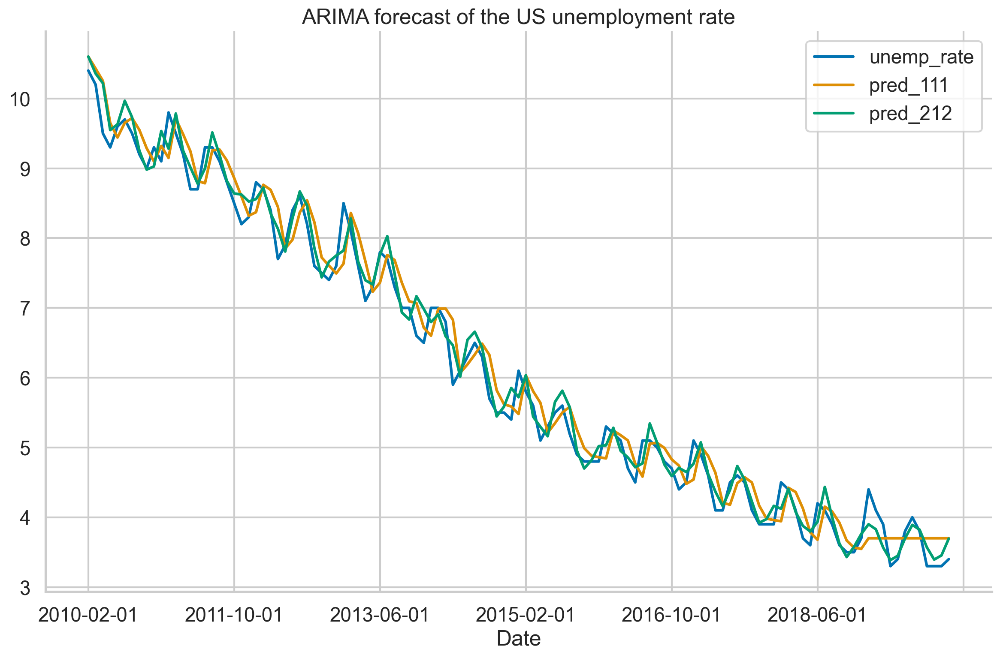

In [299]:
(
    df[["unemp_rate", "pred_111", "pred_212"]]
    .iloc[1:]
    .plot(title="ARIMA forecast of the US unemployment rate")
);

sns.despine()
plt.tight_layout()

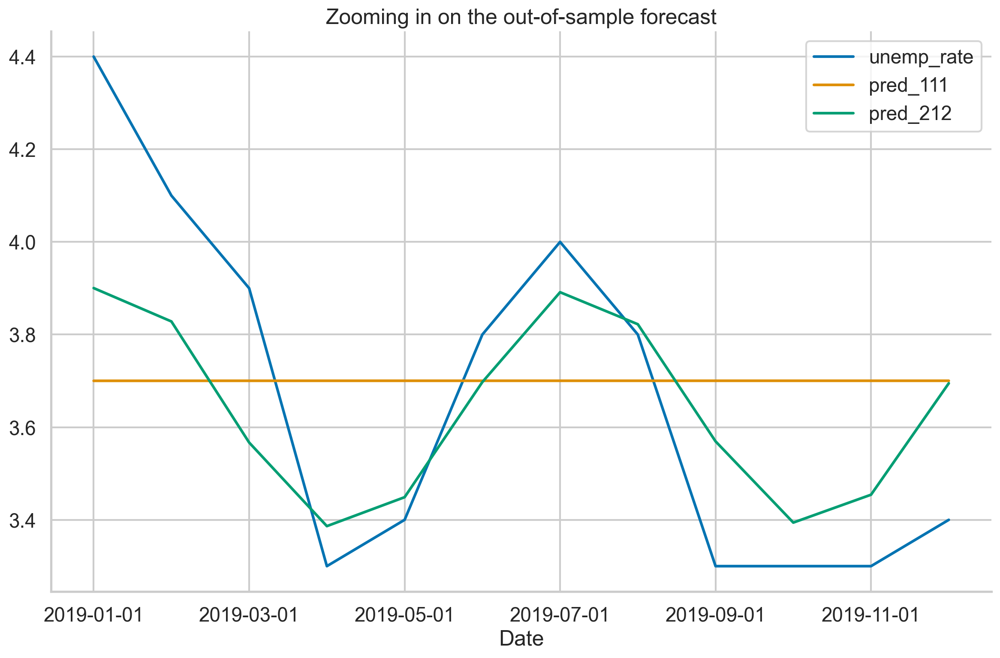

In [300]:
(
    df[["unemp_rate", "pred_111", "pred_212"]]
    .iloc[-TEST_LENGTH:]
    .plot(title="Zooming in on the out-of-sample forecast")
);

sns.despine()
plt.tight_layout()

 ARIMA(1,1,1) 모델의 예측이 거의 직선에 가깝다는 것을 볼 수 있으며, 이는 원래 시계열의 패턴을 잘 포착하지 못했음을 의미

 ARIMA(2,1,2) 모델은 원래 시계열의 패턴을 더 잘 반영하여 보다 나은 예측을 제공

 calculate the MAPEs:

In [301]:
mape_111 = mean_absolute_percentage_error(
    df["unemp_rate"].iloc[-TEST_LENGTH:], 
    df["pred_111"].iloc[-TEST_LENGTH:]
)

mape_212 = mean_absolute_percentage_error(
    df["unemp_rate"].iloc[-TEST_LENGTH:], 
    df["pred_212"].iloc[-TEST_LENGTH:]
)

print(f"MAPE of ARIMA(1,1,1): {100 * mape_111:.2f}%")
print(f"MAPE of ARIMA(2,1,2): {100 * mape_212:.2f}%")

MAPE of ARIMA(1,1,1): 9.14%
MAPE of ARIMA(2,1,2): 5.08%


8. Extract the forecast with the corresponding confidence intervals and plot them all together:

ARIMA 모델의 get_forecast 메서드와 summary_frame 메서드를 연결하여 예측값과 해당 예측의 신뢰 구간을 얻음

In [302]:
preds_df = arima_212.get_forecast(TEST_LENGTH).summary_frame()
preds_df.columns = ["fcst", "fcst_se", "ci_lower", "ci_upper"]

,unemp_rate,fcst,fcst_se,ci_lower,ci_upper
Date,,,,,
2019-01-01,4.4,NaN,NaN,NaN,NaN
2019-02-01,4.1,NaN,NaN,NaN,NaN
2019-03-01,3.9,NaN,NaN,NaN,NaN
2019-04-01,3.3,NaN,NaN,NaN,NaN
2019-05-01,3.4,NaN,NaN,NaN,NaN


get_forecast 메서드를 사용한 이유는 forecast 메서드가 포인트 예측값만 반환하고 추가 정보를 제공하지 않기 때문

In [309]:
preds_df.index = pd.to_datetime(preds_df.index)
preds_df

,fcst,fcst_se,ci_lower,ci_upper
2019-01-01,1.361058,0.037302,1.287948,1.434168
2019-02-01,1.342414,0.049241,1.245904,1.438925
2019-03-01,1.271698,0.056030,1.161881,1.381515
2019-04-01,1.219768,0.061963,1.098323,1.341212
2019-05-01,1.238049,0.069519,1.101794,1.374304
2019-06-01,1.307619,0.078679,1.153411,1.461826
2019-07-01,1.358767,0.087001,1.188247,1.529287
2019-08-01,1.340841,0.092750,1.159054,1.522628
2019-09-01,1.272399,0.096573,1.083120,1.461678
2019-10-01,1.222022,0.100175,1.025682,1.418361


In [310]:
df_test.index = pd.to_datetime(df_test.index)

In [313]:
preds_df_ext = np.exp(preds_df)

In [314]:
merged_df = preds_df_ext.merge(df_test, how='inner', left_index=True, right_index=True)
merged_df

,fcst,fcst_se,ci_lower,ci_upper,unemp_rate
2019-01-01,3.900317,1.038006,3.625340,4.196152,4.4
2019-02-01,3.828275,1.050474,3.476075,4.216161,4.1
2019-03-01,3.566905,1.057630,3.195940,3.980929,3.9
2019-04-01,3.386401,1.063923,2.999132,3.823676,3.3
2019-05-01,3.448878,1.071993,3.009561,3.952325,3.4
2019-06-01,3.697360,1.081857,3.168985,4.313831,3.8
2019-07-01,3.891392,1.090898,3.281325,4.614883,4.0
2019-08-01,3.822255,1.097188,3.186916,4.584255,3.8
2019-09-01,3.569404,1.101390,2.953880,4.313190,3.3
2019-10-01,3.394042,1.105365,2.788996,4.130347,3.3


In [312]:
plot_df = df_test[["unemp_rate"]].join(np.exp(preds_df))
plot_df.head()

,unemp_rate,fcst,fcst_se,ci_lower,ci_upper
Date,,,,,
2019-01-01,4.4,3.900317,1.038006,3.625340,4.196152
2019-02-01,4.1,3.828275,1.050474,3.476075,4.216161
2019-03-01,3.9,3.566905,1.057630,3.195940,3.980929
2019-04-01,3.3,3.386401,1.063923,2.999132,3.823676
2019-05-01,3.4,3.448878,1.071993,3.009561,3.952325


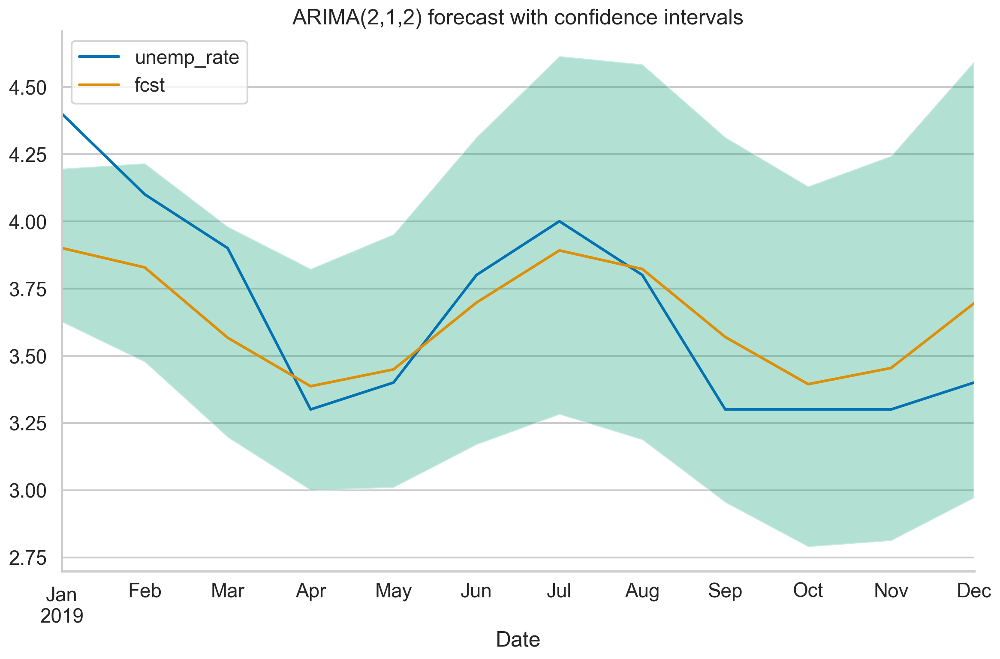

In [315]:
fig, ax = plt.subplots()

(
    plot_df[["unemp_rate", "fcst"]]
    .plot(ax=ax,
          title="ARIMA(2,1,2) forecast with confidence intervals")
)

ax.fill_between(plot_df.index,
                plot_df["ci_lower"],
                plot_df["ci_upper"],
                alpha=0.3, 
                facecolor="g")

ax.legend(loc="upper left");

sns.despine()
plt.tight_layout()

→ 분석
- 예측이 관측된 값들의 형태를 따라가고 있음을 볼 수 있음
- 신뢰 구간에서 일반적인 원뿔 모양의 패턴을 확인
- 예측 기간이 길어질수록 신뢰 구간이 넓어지며, 이는 불확실성이 증가하는 것

-----------------------------------------

※ following set of “rules” to determine the values of p and q.

a. AR 모델의 차수를 식별하는 방법:
- ACF는 시차 p까지 유의미한 자기상관을 보이며, 그 이후로는 점차 사라짐
- PACF는 관측치와 그 시차 간의 직접적인 관계만을 설명하므로, 시차 p 이후에는 유의미한 상관관계가 나타나지 않을 것으로 예상


b. MA 모델의 차수를 식별하는 방법:
- PACF는 시차 q까지 유의미한 자기상관을 보이며, 그 이후로는 점차 사라짐
- ACF는 시차 q까지 유의미한 자기상관 계수를 보이며, 그 후에는 급격히 감소하는 패턴을 나타냄

ARIMA의 차수를 수동으로 설정할 때, Hyndman과 Athanasopoulos(2018)는 p와 q가 모두 양수일 경우, ACF/PACF 플롯이 ARIMA 모델의 사양을 결정하는 데 유용하지 않을 수 있다고 경고

뒤에 ARIMA 하이퍼파라미터의 최적 값을 자동으로 결정하는 방법을 소개...

-----------------------------------------

### There's more

□ investigate some goodness-of-fit criteria of the fitted models
- 예측 성능 외에도 적합된 모델의 적합도 기준을 조사
-  how well the models fit the training data
- fitted ARIMA 모델의 잔차를 분석하는 방법을 사용

□ fitted ARIMA(2,1,2) 모델의 잔차에 대한 diagnostic plot

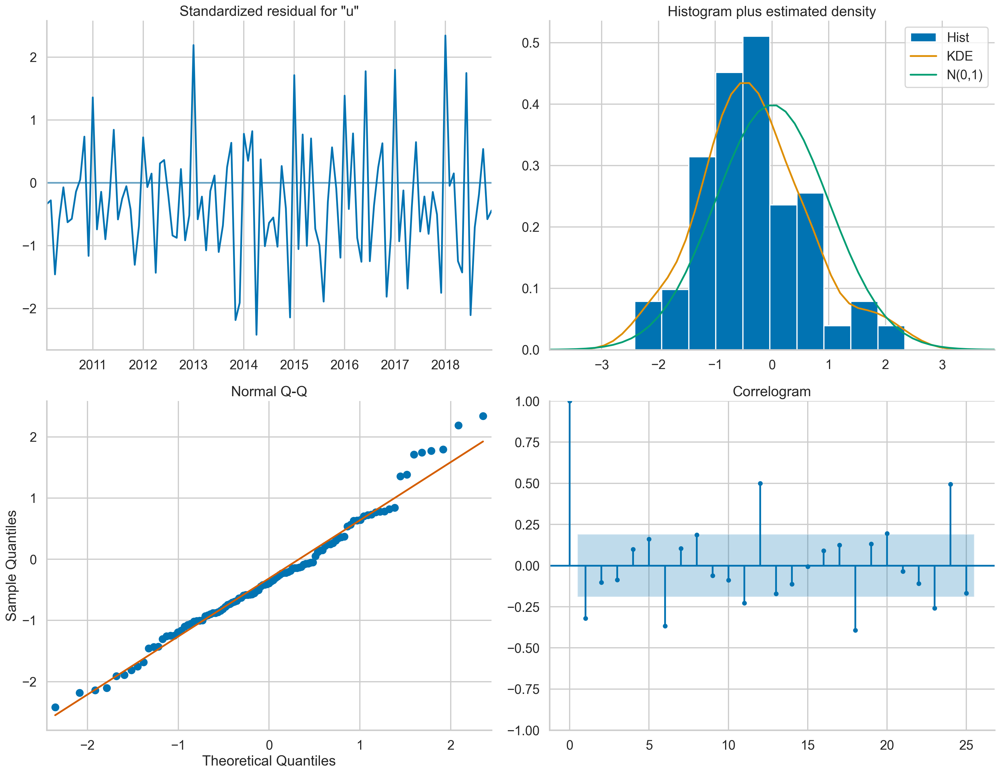

In [316]:
arima_212.plot_diagnostics(figsize=(18, 14), lags=25)

sns.despine()
plt.tight_layout()

→ 분석
- **시간에 따른 표준화된 잔차 (왼쪽 상단)**: 잔차는 백색 잡음처럼 동작해야 하며, 명확한 패턴이 없어야 함. 평균은 0, 분산은 일정해야 하지만, 이 모델에서는 음수 값이 양수 값보다 많아 평균이 음수일 가능성이 있음.
  
- **히스토그램과 KDE 추정치 (오른쪽 상단)**: 잔차의 KDE 곡선은 표준 정규 분포와 유사해야 하지만, 이 모델에서는 잔차 분포가 음수 쪽으로 치우쳐 있음.

- **Q-Q 플롯 (왼쪽 하단)**: 데이터 포인트가 직선 상에 있어야 이론적 분포와 일치함을 의미하지만, 대각선에서 벗어난 경우 실험적 분포가 왜곡되었음을 나타냄.

- **자기상관 함수 (오른쪽 하단)**: 잘 맞춘 ARIMA 모델은 잔차가 자기상관을 보이지 않아야 하지만, 이 모델에서는 12, 24 시차에서 명확한 자기상관이 나타나 모델이 계절적 패턴을 포착하지 못함을 나타냄.


□ 잔차의 autocorrelation(자기 상관관계)을 계속 조사하기 위해, autocorrelation이 없는지 테스트하는 Ljung-Box's test적용
- 이를 위해 ARIMA 모델의 test_serial_correlation 메서드를 사용하거나
- statsmodels 라이브러리의 acorr_ljungbox 함수를 사용할 수 있음

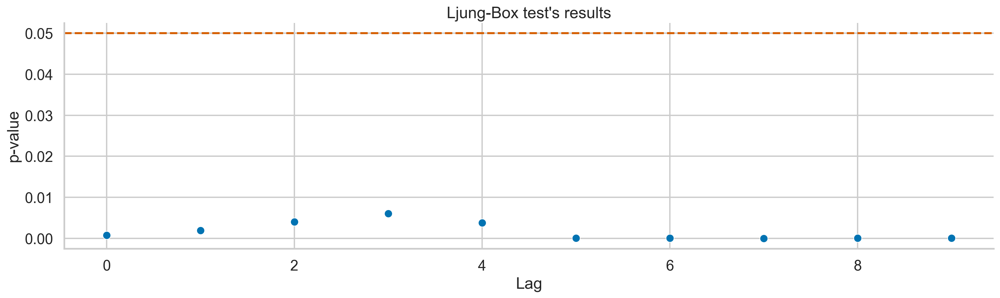

In [317]:
ljung_box_results = arima_212.test_serial_correlation(method="ljungbox")
ljung_box_pvals = ljung_box_results[0][1]

fig, ax = plt.subplots(1, figsize=[16, 5])
sns.scatterplot(x=range(len(ljung_box_pvals)), 
                y=ljung_box_pvals, 
                ax=ax)
ax.axhline(0.05, ls="--", c="r")
ax.set(title="Ljung-Box test's results",
       xlabel="Lag",
       ylabel="p-value")

sns.despine()
plt.tight_layout()

→ 분석
- 모든 p-값이 5% 유의 수준 아래에 있으므로, 잔차에 자기상관이 없다는 귀무 가설을 기각
- 우리 모델이 seasonal pattern들이 빼먹었기 때문에, 상당한 연간 상관관계를 관찰한 것과 일치
- Ljung-Box 검정을 수행할 때, 고려해야 할 시차 수(lag)를 기억하는 것이 중요</br>
"Different sources suggest a different number of lags to consider."
- statsmodels의 기본값은 비계절적 모델의 경우 min(10, nobs // 5)이고, 계절적 시계열의 경우 min(2*m, nobs // 5)</br>
m은 계절 주기</br>
자주 사용되는 다른 변형에는 min(20, nobs − 1) 및 ln(nobs)이 있음</br>
seasonal model을 사용하지 않았기 때문에 기본값은 10이지만, 데이터에 seasonal 패턴이 있음을 알고 있으므로 더 많은 시차를 고려해야 했음

In [318]:
# alternative way to get the same test results
from statsmodels.stats.diagnostic import acorr_ljungbox
ljung_box_results_df = acorr_ljungbox(arima_212.resid[1:])
ljung_box_results_df

,lb_stat,lb_pvalue
1,10.668618,0.001090
2,11.713607,0.002860
3,12.502151,0.005847
4,13.636017,0.008552
5,16.461550,0.005643
6,31.790671,0.000018
7,32.917054,0.000027
8,36.968778,0.000012
9,37.536194,0.000021
10,38.437546,0.000032


In [319]:
df_train.head()

,unemp_rate,unemp_rate_log,first_diff
Date,,,
2010-01-01,10.6,2.360854,NaN
2010-02-01,10.4,2.341806,-0.019048
2010-03-01,10.2,2.322388,-0.019418
2010-04-01,9.5,2.251292,-0.071096
2010-05-01,9.3,2.230014,-0.021277


In [320]:
arima_212.resid

Date
2010-01-01    2.360854
2010-02-01   -0.019048
2010-03-01   -0.015285
2010-04-01   -0.072866
2010-05-01   -0.026331
2010-06-01   -0.003150
2010-07-01   -0.027198
2010-08-01   -0.023987
2010-09-01   -0.005847
2010-10-01    0.002078
2010-11-01    0.029773
2010-12-01   -0.046550
2011-01-01    0.054322
2011-02-01   -0.029511
2011-03-01   -0.005664
2011-04-01   -0.035338
2011-05-01   -0.008991
2011-06-01    0.032910
2011-07-01   -0.022698
2011-08-01   -0.009862
2011-09-01   -0.002129
2011-10-01   -0.016264
2011-11-01   -0.050421
2011-12-01   -0.026650
2012-01-01    0.027761
2012-02-01   -0.002622
2012-03-01    0.005600
2012-04-01   -0.054798
2012-05-01    0.011780
2012-06-01    0.013853
2012-07-01   -0.007857
2012-08-01   -0.031981
2012-09-01   -0.033379
2012-10-01    0.008317
2012-11-01   -0.034793
2012-12-01   -0.019597
2013-01-01    0.083209
2013-02-01   -0.022020
2013-03-01   -0.008354
2013-04-01   -0.040731
2013-05-01   -0.005025
2013-06-01    0.004383
2013-07-01   -0.041670
2013-0

Note: ARIMA 모델에는 모델 적합성을 추가로 평가할 수 있는 test_normality와 test_heteroskedasticity 메서드도 포함

In [321]:
arima_212.test_normality(method="jarquebera")

array([[3.24474619, 0.19742962, 0.40372917, 3.2753263 ]])

In [322]:
arima_212.test_heteroskedasticity(method="breakvar")

array([[1.99114566, 0.04213131]])

## 6.6 Finding the best-fitting ARIMA model with auto-ARIMA

□ ARIMA 모델 하이퍼 파라미터 최적화
- ARIMA 모델의 성능은 선택한 하이퍼파라미터(p, d, q)에 따라 크게 달라짐.
- 직관, 통계적 테스트, 그리고 ACF/PACF 플롯을 기반으로 최선의 값을 선택하려고 할 수 있지만, 실제로는 쉽지 않음

□ auto-ARIMA
- ARIMA 모델(ARIMAX와 SARIMA 같은 variation 포함)의 최적 하이퍼파라미터를 자동으로 찾아주는 접근 방식
- 먼저 KPSS 테스트를 사용하여 차분(d)의 수를 결정
- 이후 스텝와이즈(stepwise) 검색을 통해 모델 공간을 탐색하여 better fit 모델을 찾음
- Akaike Information Criterion (AIC): 모델을 비교할 때 자주 사용되는 평가 지표</br>
AIC는 모델의 적합성과 간결성 간의 절충을 제공하여, 과적합과 부족적합(underfitting)의 위험을 다룸</br>
 AIC 값이 낮을수록 더 나은 모델을 나타냄

□ auto-ARIMA의 확장 버전

- ARIMAX: 외생 변수(exogenous variable)를 추가하여 모델을 확장, 외부 요인을 추가하여 더 정교한 예측이 가능
- SARIMA (Seasonal ARIMA): seasonality를 고려한 ARIMA 모델로, 시계열 데이터의 seasonary 패턴을 설명하기 위해 확장된 모델</br>
SARIMA(p,d,q)(P,D,Q)m으로, 대문자 파라미터는 seasonal 요소를 나타내며, 소문자 파라미터는 일반 ARIMA 모델과 같음</br>
m은  period of seasonality

□ 실습
- auto-ARIMA 최적의 ARIMA 모델 찾기

In [366]:
df=pd.read_csv('D:/01_study/qaunt/python_for_Finance_Cookbook/unemp_data.csv')
df=df[['Date', 'unemp_rate']]
df=df.set_index('Date')
df.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


In [367]:
df.index = pd.to_datetime(df.index)
df.head()

,unemp_rate
Date,
2010-01-01,10.6
2010-02-01,10.4
2010-03-01,10.2
2010-04-01,9.5
2010-05-01,9.3


1. Import the libraries:

In [368]:
import pandas as pd
import pmdarima as pm
from sklearn.metrics import mean_absolute_percentage_error

2. Create the train/test split:

In [369]:
TEST_LENGTH = 12
df_train = df.iloc[:-TEST_LENGTH]
df_test = df.iloc[-TEST_LENGTH:]

3. Find the best hyperparameters of the ARIMA model using the auto-ARIMA procedure:
- auto_arima 함수를 사용하여 ARIMA 모델의 최적 하이퍼파라미터를 찾음
    - KPSS test 대신 augmented Dickey-Fuller test를 사용하여 정상성 검사를 진행
    - SARIMA 대신 ARIMA 모델을 fit하기 위해 계절성을 비활성화
    - intercept 포함하지 않은 모델을 추정하고자 했으며, 이는 statsmodels에서 ARIMA를 추정할 때 기본 설정임
    - 최적의 하이퍼파라미터를 식별하기 위해 단계별(stepwise) 알고리즘을 사용</br>
 False로 설정하면, GridSearchCV처럼 모든 가능한 하이퍼파라미터 조합을 시도하는 전체 그리드 검색을 실행</br>
 n_jobs 인자를 통해 병렬로 몇 개의 모델을 맞출지 지정

- 참고. 다른 setting 방법
    - 검색을 시작할 때 하이퍼파라미터의 초기 값을 선택
    - 검색에서 파라미터의 최대 값을 제한
    - 차분 횟수를 결정하는 다른 통계 검사를 선택
    - 샘플 외 평가 기간(out_of_sample_size)을 선택하여, 일부 데이터는 홀드아웃 세트로 남겨두고 그 외 데이터로 모델을 학습시키는 방법
    - 모델 적합 시간이나 하이퍼파라미터 조합 시도 횟수를 제한(fitting 시간 오래 걸리거나 더 작은 단위로 나뉘어 매우 구체적이고 자세한 데이터에 대해...)

- trace=True를 통해 적합 모델 정보 확인 가능

In [328]:
auto_arima = pm.auto_arima(df_train,
                           test="adf",
                           seasonal=False,
                           with_intercept=False,
                           stepwise=True,
                           suppress_warnings=True,
                           trace=True)
                            
auto_arima.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=7.411, Time=1.93 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=77.864, Time=0.02 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=77.461, Time=0.01 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=75.688, Time=0.01 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=68.551, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=54.321, Time=0.06 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=7.458, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=7.152, Time=0.17 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=60.069, Time=0.05 sec
 ARIMA(3,1,3)(0,0,0)[0]             : AIC=10.492, Time=0.20 sec
 ARIMA(2,1,4)(0,0,0)[0]             : AIC=inf, Time=0.20 sec
 ARIMA(1,1,4)(0,0,0)[0]             : AIC=inf, Time=0.21 sec
 ARIMA(3,1,4)(0,0,0)[0]             : AIC=inf, Time=0.27 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=25.922, Time=0.29 sec

Best model:  ARIMA(2,1,3)(0,0,0)[0]          
Total fit time: 3.724 seco

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  108
Model:               SARIMAX(2, 1, 3)   Log Likelihood                   2.424
Date:                Thu, 19 Sep 2024   AIC                              7.152
Time:                        19:41:43   BIC                             23.189
Sample:                    01-01-2010   HQIC                            13.654
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0041      0.007    134.470      0.000       0.989       1.019
ar.L2         -0.9970      0.004   -242.130      0.000      -1.005      -0.989
ma.L1         -1.2896      0.114    -11.332      0.000      -1.513      -1.067
ma.L2          1.2153      0.172      7.082      0.000       0.879       1.552
ma.L3         -0.2162      0.103     -2.106      0.035      -0.417      -0.015
sigma2         0.0525      0.010      5.267      0.000       0.033       0.072
===================================================================================
Ljung-Box (L1) (Q):                   2.76   Jarque-Bera (JB):                 1.42
Prob(Q):                              0.10   Prob(JB):                         0.49
Heteroskedasticity (H):               0.48   Skew:                             0.27
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.13
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

→ 분석
- 이번 절차에서는 로그 변환을 적용하지 않음(앞의 그림과 비교해서 다른 점이 있음)
- 최적의 ARIMA 모델이 ARIMA(2,1,3)라는 것을 확인

- statsmodels 라이브러리로 추정한 ARIMA 모델과 유사하게, pmdarima(사실상 statsmodels의 래퍼)에서도 plot_diagnostics 메서드를 사용하여 잔차(residuals)를 분석함으로써 모델의 적합도를 확인

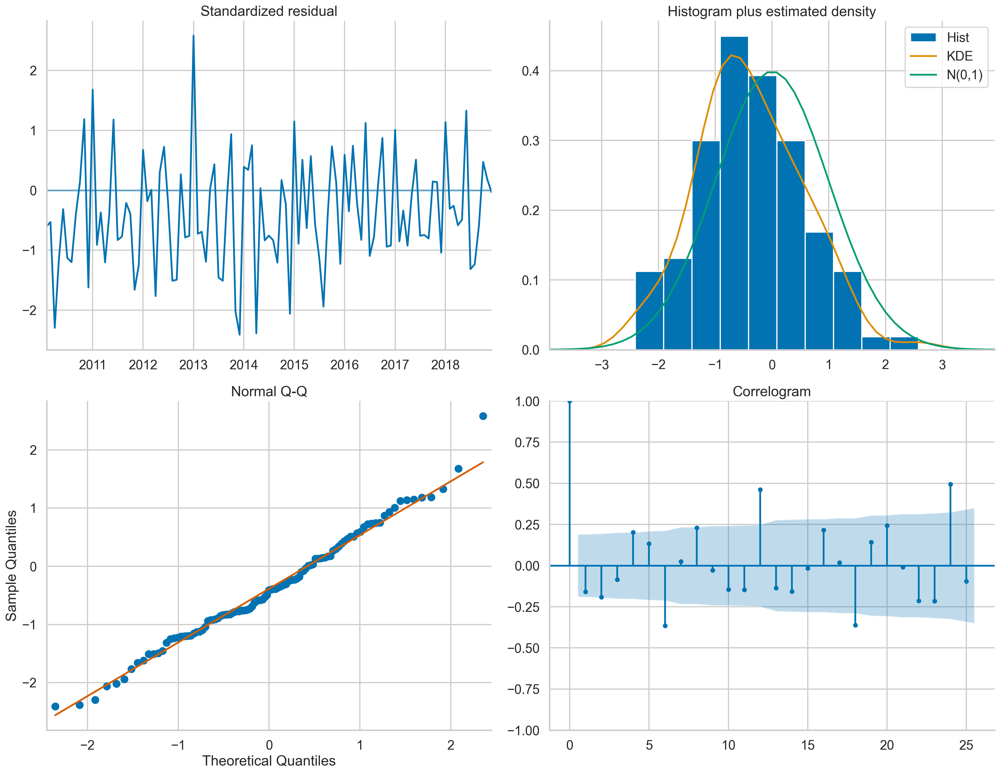

In [329]:
auto_arima.plot_diagnostics(figsize=(18, 14), lags=25)

sns.despine()
plt.tight_layout()

→ 분석
- ARIMA(2,1,3) 모델도 연간 계절 패턴을 제대로 포착하는 데 어려움을 겪고 있음. 이는 Correlogram(자기상관 함수 그래프)에서 명확하게 확인

4. Find the best hyperparameters of a SARIMA model using the auto-ARIMA procedure:
- auto_arima 함수를 사용하여 최적의 SARIMA 모델을 찾음
- seasonal=True를 설정하고, m=12로 월별 데이터를 처리

In [330]:
auto_sarima = pm.auto_arima(df_train,
                            test="adf",
                            seasonal=True,
                            m=12,
                            with_intercept=False,
                            stepwise=True,
                            suppress_warnings=True,
                            trace=True)
auto_sarima.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(1,0,1)[12]             : AIC=inf, Time=2.01 sec
 ARIMA(0,1,0)(0,0,0)[12]             : AIC=77.864, Time=0.02 sec
 ARIMA(1,1,0)(1,0,0)[12]             : AIC=-19.349, Time=0.07 sec
 ARIMA(0,1,1)(0,0,1)[12]             : AIC=39.115, Time=0.07 sec
 ARIMA(1,1,0)(0,0,0)[12]             : AIC=77.461, Time=0.00 sec
 ARIMA(1,1,0)(2,0,0)[12]             : AIC=inf, Time=0.24 sec
 ARIMA(1,1,0)(1,0,1)[12]             : AIC=inf, Time=0.26 sec
 ARIMA(1,1,0)(0,0,1)[12]             : AIC=39.307, Time=0.07 sec
 ARIMA(1,1,0)(2,0,1)[12]             : AIC=inf, Time=0.51 sec
 ARIMA(0,1,0)(1,0,0)[12]             : AIC=-19.382, Time=0.02 sec
 ARIMA(0,1,0)(2,0,0)[12]             : AIC=inf, Time=0.10 sec
 ARIMA(0,1,0)(1,0,1)[12]             : AIC=inf, Time=0.18 sec
 ARIMA(0,1,0)(0,0,1)[12]             : AIC=37.495, Time=0.04 sec
 ARIMA(0,1,0)(2,0,1)[12]             : AIC=inf, Time=0.44 sec
 ARIMA(0,1,1)(1,0,0)[12]             : AIC=-22.056, Time=0.07 sec


<class 'statsmodels.iolib.summary.Summary'>
"""
                                        SARIMAX Results                                        
===============================================================================================
Dep. Variable:                                       y   No. Observations:                  108
Model:             SARIMAX(1, 1, 5)x(1, 0, [1, 2], 12)   Log Likelihood                  41.605
Date:                                 Thu, 19 Sep 2024   AIC                            -63.210
Time:                                         19:50:48   BIC                            -36.482
Sample:                                     01-01-2010   HQIC                           -52.375
                                          - 12-01-2018                                         
Covariance Type:                                   opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          0.3355      0.330      1.017      0.309      -0.311       0.982
ma.L1         -0.6069      0.316     -1.923      0.055      -1.226       0.012
ma.L2         -0.0166      0.158     -0.105      0.916      -0.326       0.293
ma.L3         -0.1816      0.149     -1.220      0.223      -0.474       0.110
ma.L4          0.1249      0.163      0.764      0.445      -0.195       0.445
ma.L5          0.2295      0.144      1.588      0.112      -0.054       0.513
ar.S.L12       0.9981      0.013     75.529      0.000       0.972       1.024
ma.S.L12      -1.0051      0.321     -3.135      0.002      -1.633      -0.377
ma.S.L24       0.1136      0.136      0.837      0.403      -0.152       0.380
sigma2         0.0195      0.006      3.051      0.002       0.007       0.032
===================================================================================
Ljung-Box (L1) (Q):                   0.05   Jarque-Bera (JB):                 1.91
Prob(Q):                              0.82   Prob(JB):                         0.39
Heteroskedasticity (H):               0.63   Skew:                            -0.30
Prob(H) (two-sided):                  0.17   Kurtosis:                         3.26
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

- various residual plots:

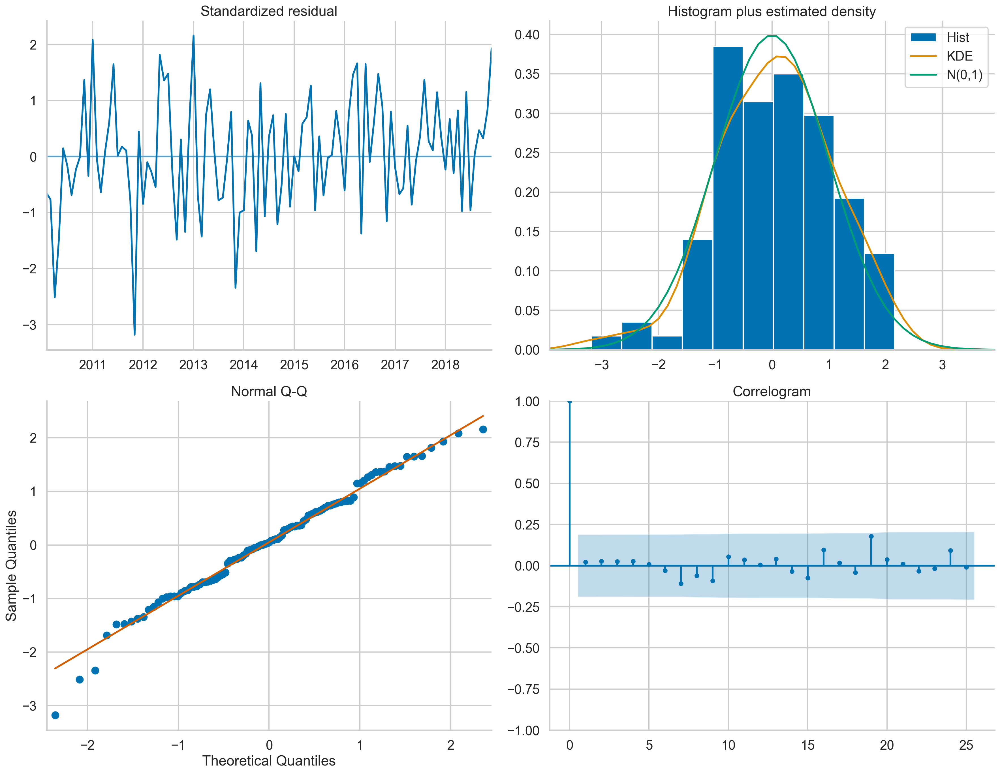

In [331]:
auto_sarima.plot_diagnostics(figsize=(18, 14), lags=25);

sns.despine()
plt.tight_layout()

→ 분석
- SARIMA 모델은 ARIMA(2,1,2) 모델보다 better fit을 보인다

5. Calculate the forecasts from the two models and plot them:
- 두 모델에서 나온 예측 값을 predict 메서드를 사용하여 계산하고, 실제 값과 함께 플롯하여 MAPE(평균 절대 백분율 오차)를 계산

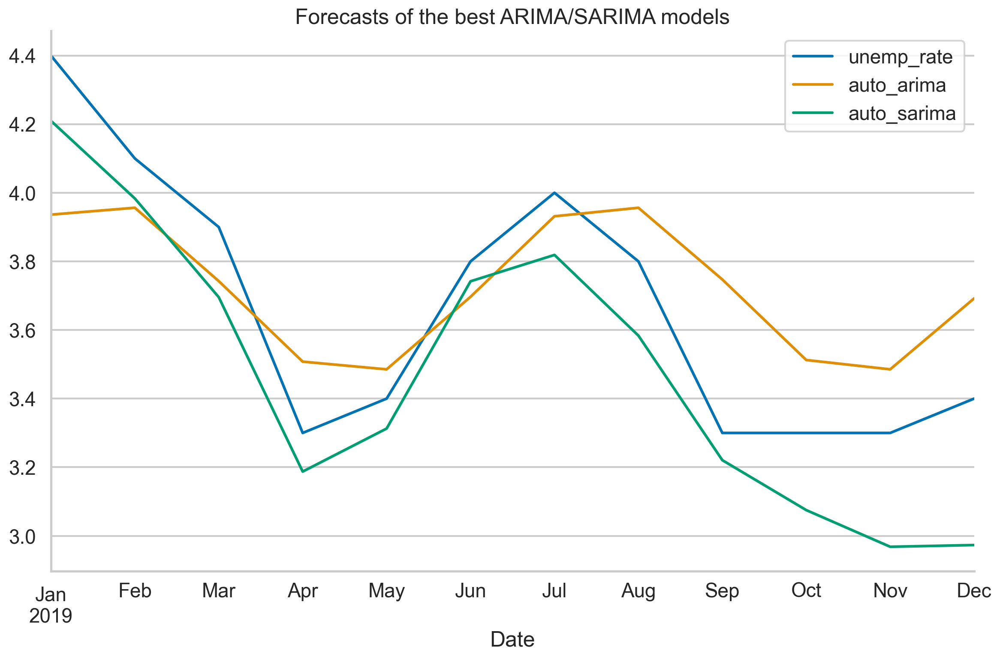

In [332]:
df_test["auto_arima"] = auto_arima.predict(TEST_LENGTH)
df_test["auto_sarima"] = auto_sarima.predict(TEST_LENGTH)
df_test.plot(title="Forecasts of the best ARIMA/SARIMA models");

sns.despine()
plt.tight_layout()

→ 분석
- SARIMA 모델이 ARIMA 모델보다 계절 패턴을 더 잘 포착

- MAPE(평균 절대 백분율 오차)를 계산

In [335]:
mape_auto_arima = mean_absolute_percentage_error(
    df_test["unemp_rate"], 
    df_test["auto_arima"]
)

mape_auto_sarima = mean_absolute_percentage_error(
    df_test["unemp_rate"], 
    df_test["auto_sarima"]
)

print(f"MAPE of auto-ARIMA: {100*mape_auto_arima:.2f}%")
print(f"MAPE of auto-SARIMA: {100*mape_auto_sarima:.2f}%")

MAPE of auto-ARIMA: 5.80%
MAPE of auto-SARIMA: 5.16%


### There's more

□ pmdarima 라이브러리의 auto-ARIMA 프레임워크를 사용하여 더 복잡한 모델이나 전체 파이프라인을 추정 가능</br>
&nbsp;&nbsp;&nbsp;&nbsp;파이프라인에는 target 변수를 변환하거나 새로운 feature를 추가하는 작업도 포함될 수 있음

1. Import the libraries:

In [336]:
from pmdarima.pipeline import Pipeline
from pmdarima.preprocessing import FourierFeaturizer
from pmdarima.preprocessing import LogEndogTransformer
from pmdarima import arima

2. Create new features (month dummies) and split them into the train/test sets:

- 더미 변수를 생성
- 각 열에는 관측값이 주어진 달에서 왔는지를 나타내는 불리언 플래그가 포함
- 첫 번째 열 삭제: dummy-variable trap(perfect multicollinearity)을 피하기 위해...


In [370]:
month_dummies = pd.get_dummies(
    df.index.month, 
    prefix="month_", 
    drop_first=True
)
month_dummies.index = df.index
df = df.join(month_dummies)

df_train = df.iloc[:-TEST_LENGTH]
df_test = df.iloc[-TEST_LENGTH:]

In [371]:
month_dummies.head()

,month__2,month__3,month__4,month__5,month__6,month__7,month__8,month__9,month__10,month__11,month__12
Date,,,,,,,,,,,
2010-01-01,False,False,False,False,False,False,False,False,False,False,False
2010-02-01,True,False,False,False,False,False,False,False,False,False,False
2010-03-01,False,True,False,False,False,False,False,False,False,False,False
2010-04-01,False,False,True,False,False,False,False,False,False,False,False
2010-05-01,False,False,False,True,False,False,False,False,False,False,False


3. Find the best hyperparameters of the ARIMAX model:

- 최적의 모델 찾기 위해 auto_arima 함수를 사용
- exogenous argument로 exogenous variables 지정: 타겟 변수를 포함하지 않는 모든 열을 지정(또는 Target과 분리된 별도의 object로 변수 만들 수 있음. Target = [y1, y2, ...], exogenous = [Target을 제외한 컬럼])

In [372]:
auto_arimax = pm.auto_arima(
    df_train[["unemp_rate"]],
    exogenous=df_train.drop(columns=["unemp_rate"]),
    test="adf",
    seasonal=False,
    with_intercept=False,
    stepwise=True,
    suppress_warnings=True,
    trace=True
)
                            
auto_arimax.summary()

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=7.411, Time=0.27 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=77.864, Time=0.01 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=77.461, Time=0.00 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=75.688, Time=0.02 sec
 ARIMA(1,1,2)(0,0,0)[0]             : AIC=68.551, Time=0.03 sec
 ARIMA(2,1,1)(0,0,0)[0]             : AIC=54.321, Time=0.11 sec
 ARIMA(3,1,2)(0,0,0)[0]             : AIC=7.458, Time=0.22 sec
 ARIMA(2,1,3)(0,0,0)[0]             : AIC=7.152, Time=0.15 sec
 ARIMA(1,1,3)(0,0,0)[0]             : AIC=60.069, Time=0.05 sec
 ARIMA(3,1,3)(0,0,0)[0]             : AIC=10.492, Time=0.18 sec
 ARIMA(2,1,4)(0,0,0)[0]             : AIC=inf, Time=0.15 sec
 ARIMA(1,1,4)(0,0,0)[0]             : AIC=inf, Time=0.18 sec
 ARIMA(3,1,4)(0,0,0)[0]             : AIC=inf, Time=0.25 sec
 ARIMA(2,1,3)(0,0,0)[0] intercept   : AIC=25.922, Time=0.18 sec

Best model:  ARIMA(2,1,3)(0,0,0)[0]          
Total fit time: 1.827 seco

<class 'statsmodels.iolib.summary.Summary'>
"""
                               SARIMAX Results                                
==============================================================================
Dep. Variable:                      y   No. Observations:                  108
Model:               SARIMAX(2, 1, 3)   Log Likelihood                   2.424
Date:                Sat, 21 Sep 2024   AIC                              7.152
Time:                        03:19:28   BIC                             23.189
Sample:                    01-01-2010   HQIC                            13.654
                         - 12-01-2018                                         
Covariance Type:                  opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
ar.L1          1.0041      0.007    134.470      0.000       0.989       1.019
ar.L2         -0.9970      0.004   -242.130      0.000      -1.005      -0.989
ma.L1         -1.2896      0.114    -11.332      0.000      -1.513      -1.067
ma.L2          1.2153      0.172      7.082      0.000       0.879       1.552
ma.L3         -0.2162      0.103     -2.106      0.035      -0.417      -0.015
sigma2         0.0525      0.010      5.267      0.000       0.033       0.072
===================================================================================
Ljung-Box (L1) (Q):                   2.76   Jarque-Bera (JB):                 1.42
Prob(Q):                              0.10   Prob(JB):                         0.49
Heteroskedasticity (H):               0.48   Skew:                             0.27
Prob(H) (two-sided):                  0.03   Kurtosis:                         3.13
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

plot_diagnostics 메서드를 사용하여 잔차 plot

더미 변수를 포함함으로써 연간 계절성과 관련된 자기상관 문제들이 해결된 것으로 보여야하는데
데이터가 바뀌어 해결이 안된 듯...

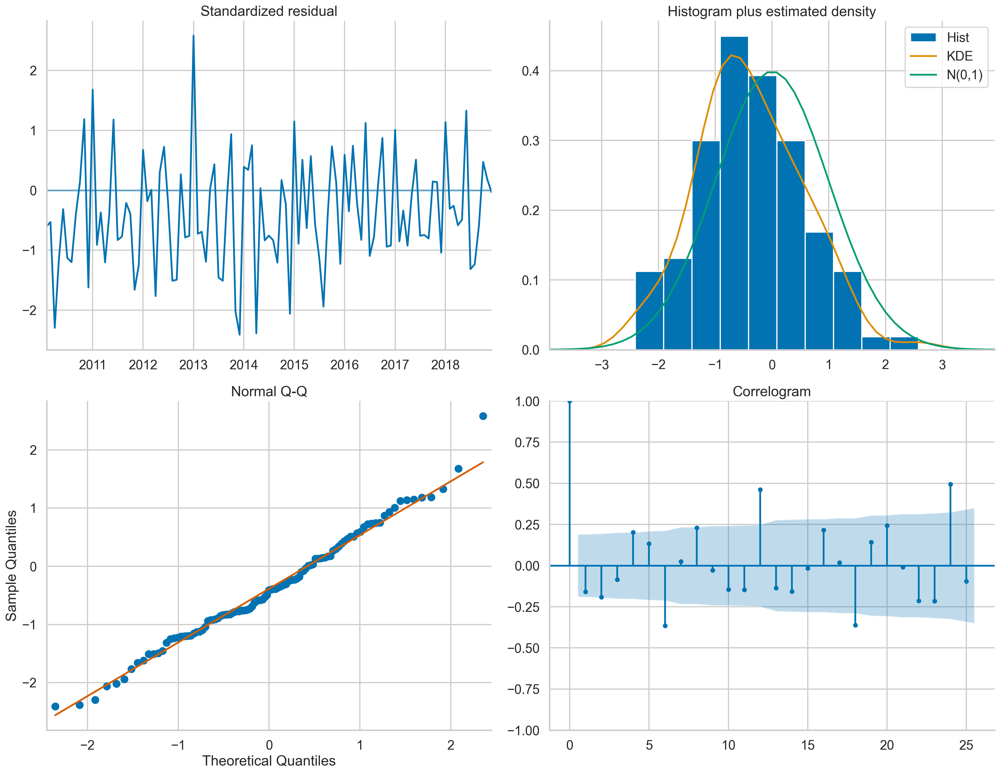

In [373]:
auto_arimax.plot_diagnostics(figsize=(18, 14), lags=25);

sns.despine()
plt.tight_layout()
# plt.savefig("images/figure_6_32", dpi=200)

4. Find the best hyperparameters of the ARIMA pipeline:

최적의 ARIMA 모델을 찾는 전체 데이터 변환 및 모델링 파이프라인을 만드는 방법
- 타겟에 로그 변환을 적용
- FourierFeaturizer를 사용하여 새로운 특성을 생성(계절 모델을 사용하지 않고도 계절 시계열의 계절성을 설명 가능)</br>
계절 주기성 m을 지정
- auto-ARIMA 절차를 사용하여 최적의 모델을 찾음</br>
파이프라인을 사용할 때는 pm.auto_arima 함수 대신 AutoARIMA 클래스를 사용해야 한다는 점에 유의

In [342]:
auto_arima_pipe = Pipeline([
    ("log_transform", LogEndogTransformer()),
    ("fourier", FourierFeaturizer(m=12)),
    ("arima", arima.AutoARIMA(stepwise=True, trace=1, 
                              error_action="warn",
                              test="adf", seasonal=False, 
                              with_intercept=False, 
                              suppress_warnings=True))
])

auto_arima_pipe.fit(df_train[["unemp_rate"]])

Performing stepwise search to minimize aic
 ARIMA(2,1,2)(0,0,0)[0]             : AIC=-443.949, Time=2.99 sec
 ARIMA(0,1,0)(0,0,0)[0]             : AIC=-451.806, Time=0.08 sec
 ARIMA(1,1,0)(0,0,0)[0]             : AIC=-449.936, Time=0.05 sec
 ARIMA(0,1,1)(0,0,0)[0]             : AIC=-449.932, Time=0.09 sec
 ARIMA(1,1,1)(0,0,0)[0]             : AIC=-447.934, Time=0.23 sec
 ARIMA(0,1,0)(0,0,0)[0] intercept   : AIC=-462.898, Time=0.04 sec
 ARIMA(1,1,0)(0,0,0)[0] intercept   : AIC=-464.399, Time=0.05 sec
 ARIMA(2,1,0)(0,0,0)[0] intercept   : AIC=-465.503, Time=0.10 sec
 ARIMA(3,1,0)(0,0,0)[0] intercept   : AIC=-475.671, Time=0.18 sec
 ARIMA(4,1,0)(0,0,0)[0] intercept   : AIC=-483.865, Time=0.30 sec
 ARIMA(5,1,0)(0,0,0)[0] intercept   : AIC=-482.069, Time=0.49 sec
 ARIMA(4,1,1)(0,0,0)[0] intercept   : AIC=-481.423, Time=0.40 sec
 ARIMA(3,1,1)(0,0,0)[0] intercept   : AIC=-478.962, Time=0.40 sec
 ARIMA(5,1,1)(0,0,0)[0] intercept   : AIC=-480.454, Time=0.53 sec
 ARIMA(4,1,0)(0,0,0)[0]          

Pipeline(steps=[('log_transform', LogEndogTransformer()),
                ('fourier', FourierFeaturizer(m=12)),
                ('arima',
                 AutoARIMA(error_action='warn', seasonal=False, test='adf',
                           trace=1, with_intercept=False))])

--------------------------------

파이프라인을 사용하는 가장 큰 장점은 모든 단계를 스스로 수행할 필요가 없다는 것
- 코드를 재사용 가능
- 데이터에 대해 수행되는 작업의 명확한 순서를 정의
- 특성을 생성하고 데이터를 분할할 때 잠재적인 데이터 누수를 방지

파이프라인을 사용하는 잠재적인 단점은 일부 작업이 더 이상 쉽게 추적되지 않는다는 점
파이프라인의 특정 요소에 접근하기가 조금 더 어려워진다는 것(예. auto_arima_pipe.summary()를 실행하여 적합된 ARIMA 모델의 요약을 얻을 수 없음)

--------------------------------------

5. Calculate the forecasts and plot them:

predict 메서드를 사용하여 예측을 생성
- 타겟만 포함된 새로운 DataFrame을 생성: 이전 단계에서 생성한 추가 열을 제거하기 위함
- fitted ARIMAX 모델로 predict 메서드를 사용할 때는 예측에 필요한 exogenous variable도 제공
- 타겟 변수를 변환하는 파이프라인의 predict 메서드를 사용할 때, 반환된 예측값(또는 적합값)은 원래 입력과 동일한 스케일로 표현</br>
원래 시계열이 로그 변환</br>
새로운 특성이 추가</br>
모델에서 예측값을 획득(여전히 로그 변환된 스케일에서...)</br>
예측값은 지수 함수(exponent function)를 사용하여 원래 스케일로 변환

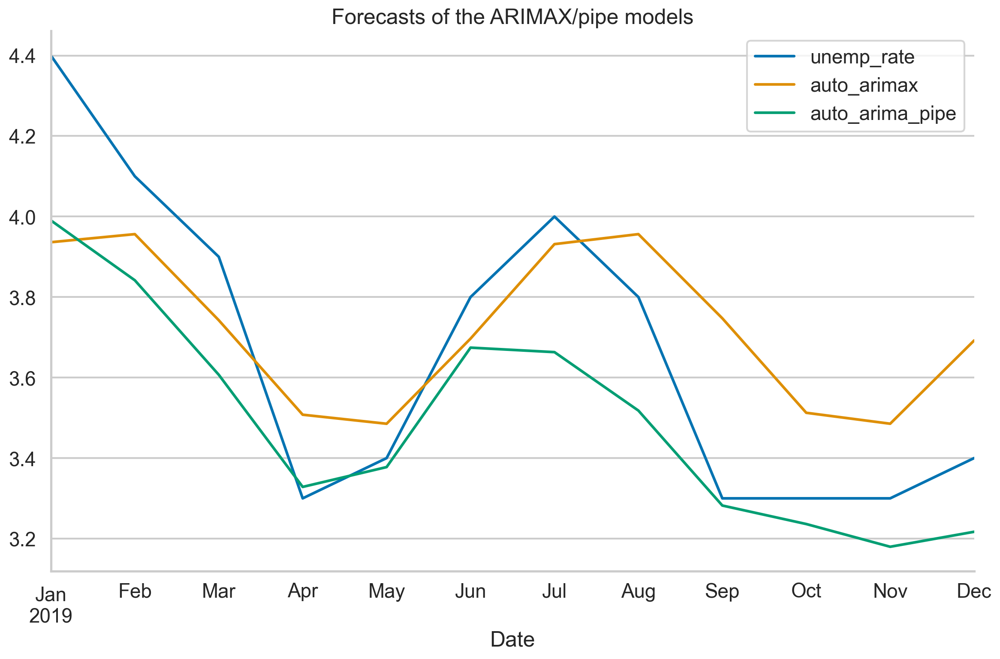

In [343]:

# specify return_conf_int when calling `predict` to get the confidence intervals
results_df = df_test[["unemp_rate"]].copy()
results_df["auto_arimax"] = auto_arimax.predict(
    TEST_LENGTH, 
    X=df_test.drop(columns=["unemp_rate"])
)
results_df["auto_arima_pipe"] = auto_arima_pipe.predict(TEST_LENGTH)
results_df.plot(title="Forecasts of the ARIMAX/pipe models");

sns.despine()
plt.tight_layout()

7. Calculate the MAPEs:

In [344]:
mape_auto_arimax = mean_absolute_percentage_error(results_df["unemp_rate"], 
                                                  results_df["auto_arimax"])

mape_auto_pipe = mean_absolute_percentage_error(results_df["unemp_rate"], 
                                                results_df["auto_arima_pipe"])

print(f"MAPE of auto-ARIMAX: {100*mape_auto_arimax:.2f}%")
print(f"MAPE of auto-pipe: {100*mape_auto_pipe:.2f}%")

MAPE of auto-ARIMAX: 5.80%
MAPE of auto-pipe: 4.61%


이번 챕터에서 시도한 모든 ARIMA 모델 중에서 파이프라인 모델이 가장 좋은 성과

but, 지수 평활법(exponential smoothing methods)보다는 성능이 크게 떨어짐

※ pmdarima 라이브러리의 ARIMA 모델/파이프라인에서 predict 메서드를 사용할 때, return_conf_int 인수를 True로 설정하면 점 예측뿐만 아니라 해당하는 신뢰 구간도 반환

## Summary
- 이번 챕터에서 시계열 분석 및 예측에 대한 통계적 접근 방법 다룸
- 시계열을 추세, 계절성, 그리고 잔여 구성 요소로 분해하는 방법 배움
- 시계열이 정상인지 테스트하는 방법을 설명(일부 통계 모델(예: ARIMA)은 정상성을 요구하기 때문)</br>
비정상 시계열을 정상 시계열로 변환하기 위해 취할 수 있는 단계에 대해서도 설명
- 시계열 예측을 위한 가장 인기 있는 두 가지 통계적 접근 방식인 지수 평활법과 ARIMA 모델을 탐구</br>
이러한 모델을 자동으로 조정하고 하이퍼파라미터 선택을 포함한 보다 현대적인 접근 방법에 대해서도 간단히 언급